# Importing libraries and packages

In [155]:
import joblib
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.metrics import classification_report
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.experimental import enable_halving_search_cv
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.dummy import DummyClassifier
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.inspection import permutation_importance
from matplotlib.colors import ListedColormap
from catboost import CatBoostClassifier
from fairlearn.adversarial import AdversarialFairnessClassifier
from fairlearn.metrics import demographic_parity_difference, equalized_odds_difference
import tensorflow as tf
from math import sqrt
from functools import partial
import matplotlib.pyplot as plt
from sklearn.model_selection import (
    train_test_split, 
    KFold, 
    cross_val_score, 
    HalvingGridSearchCV
)
from sklearn.metrics import (
    f1_score, 
    precision_score, 
    recall_score, 
    roc_auc_score, 
    accuracy_score, 
    confusion_matrix
)



# 1. Dataset processing

## 1.1 Preparing the individual panel datasets

In [168]:
# loading in all the panels in label

background = pd.read_csv('/Users/kevinduquesnoy/Documents/DSS/Thesis/Coding work/Datasets/LISS/1. Background variables/background_variables.csv', sep = ';',index_col='nomem_encr')
health = pd.read_csv('/Users/kevinduquesnoy/Documents/DSS/Thesis/Coding work/Datasets/LISS/2. Health/health.csv', sep = ';',index_col='nomem_encr')
religion = pd.read_csv('/Users/kevinduquesnoy/Documents/DSS/Thesis/Coding work/Datasets/LISS/3. Religion, ethnicity /religion_ethnicity.csv', sep = ';',index_col='nomem_encr')
social = pd.read_csv('/Users/kevinduquesnoy/Documents/DSS/Thesis/Coding work/Datasets/LISS/4. Social, leisure /social_integration_leisure.csv', sep = ';',index_col='nomem_encr')
politics = pd.read_csv('/Users/kevinduquesnoy/Documents/DSS/Thesis/Coding work/Datasets/LISS/8. Politics and values/politics_values.csv', sep = ';',index_col='nomem_encr')
assets = pd.read_csv('/Users/kevinduquesnoy/Documents/DSS/Thesis/Coding work/Datasets/LISS/9. Assets/assets.csv', sep = ';',index_col='nomem_encr')


/var/folders/hk/gkxw9p6d3wb6_vcyr1zh90780000gn/T/ipykernel_14321/4277617804.py:4: DtypeWarning: Columns (2,3,4) have mixed types. Specify dtype option on import or set low_memory=False.
  health = pd.read_csv('/Users/kevinduquesnoy/Documents/DSS/Thesis/Coding work/Datasets/LISS/2. Health/health.csv', sep = ';',index_col='nomem_encr')


## 1.2 imputation of missing values

In [169]:
# Compiling a list of relevant features per panel

# first create a list of all the relevant features selected per dataframe
# this will be used to easily select the relevant features for processing

# Separate lists for each category of variables

background_variables = ['herkomstgroep', 'burgstat', 'woonvorm', 'positie', 'aantalhh', 'aantalki', 'brutoink', 'nettoink', 'brutocat', 'nettocat', 'oplmet', 'oplzon', 'belbezig', 'woning']
health_variables = ['ch24q159', 'ch24q160', 'ch24q161', 'ch24q162', 'ch24q163', 'ch24q270', 'ch24q004', 'ch24q011', 'ch24q012', 'ch24q013', 'ch24q014', 'ch24q015', 'ch24q018', 'ch24q125', 'ch24q130', 'ch24q133', 'ch24q135', 'ch24q164', 'ch24q165', 'ch24q166', 'ch24q167', 'ch24q168', 'ch24q271', 'ch24q023', 'ch24q024', 'ch24q025', 'ch24q026', 'ch24q027', 'ch24q028', 'ch24q029', 'ch24q030', 'ch24q031', 'ch24q034', 'ch24q044']
religion_variables = ['cr24q143','cr24q164', 'cr24q165', 'cr24q166', 'cr24q167', 'cr24q168', 'cr24q169', 'cr24q170', 'cr24q171', 'cr24q172', 'cr24q173', 'cr24q174', 'cr24q175', 'cr24q176', 'cr24q177', 'cr24q178', 'cr24q179', 'cr24q181', 'cr24q079', 'cr24q080', 'cr24q081', 'cr24q082', 'cr24q083', 'cr24q084', 'cr24q085', 'cr24q086', 'cr24q087', 'cr24q097', 'cr24q098']
social_variables = ['cs24q634', 'cs24q635', 'cs24q636', 'cs24q290', 'cs24q291', 'cs24q292', 'cs24q005', 'cs24q006', 'cs24q010', 'cs24q011', 'cs24q015', 'cs24q016', 'cs24q020', 'cs24q021', 'cs24q025', 'cs24q026', 'cs24q030', 'cs24q031', 'cs24q035', 'cs24q036', 'cs24q040', 
                    'cs24q041', 'cs24q045', 'cs24q046', 'cs24q050', 'cs24q051', 'cs24q055', 'cs24q056', 'cs24q060', 'cs24q061', 'cs24q065', 'cs24q066', 'cs24q284', 'cs24q285', 'cs24q286', 'cs24q287', 'cs24q288', 'cs24q289', 'cs24q063', 'cs24q064', 'cs24q065', 'cs24q007', 'cs24q012', 'cs24q017', 'cs24q022', 'cs24q027', 'cs24q032', 'cs24q037', 'cs24q042', 'cs24q047', 
                    'cs24q052', 'cs24q057', 'cs24q062', 'cs24q067', 'cs24q104', 'cs24q160', 'cs24q161', 'cs24q162', 'cs24q164', 'cs24q165', 'cs24q166', 'cs24q167', 'cs24q169', 'cs24q171', 'cs24q172', 'cs24q173', 'cs24q174', 'cs24q175', 'cs24q176', 'cs24q177', 'cs24q178', 'cs24q179', 'cs24q180', 'cs24q181', 'cs24q182', 'cs24q183', 'cs24q184', 'cs24q185', 'cs24q186', 
                    'cs24q187', 'cs24q188', 'cs24q189', 'cs24q190', 'cs24q191', 'cs24q192', 'cs24q195', 'cs24q196', 'cs24q197', 'cs24q198', 'cs24q199', 'cs24q200', 'cs24q201', 'cs24q202', 'cs24q205', 'cs24q206', 'cs24q209', 'cs24q210', 'cs24q211', 'cs24q212', 'cs24q213', 'cs24q214', 'cs24q215', 'cs24q216', 'cs24q217', 'cs24q218', 'cs24q219', 'cs24q220', 'cs24q221', 
                    'cs24q222', 'cs24q223', 'cs24q224', 'cs24q225', 'cs24q226', 'cs24q227', 'cs24q228', 'cs24q229', 'cs24q230', 'cs24q231', 'cs24q232', 'cs24q233', 'cs24q234', 'cs24q235', 'cs24q236', 'cs24q237', 'cs24q238', 'cs24q239', 'cs24q240']
politics_variables = ['cv25q013', 'cv25q014', 'cv25q015', 'cv25q016', 'cv25q017', 'cv25q018', 'cv25q019', 'cv25q020', 'cv25q021', 'cv25q022', 'cv25q023', 'cv25q024', 'cv25q025', 'cv25q026', 'cv25q027']
assets_variables = ['ca22h078', 'ca22h005', 'ca22h006', 'ca22h007', 'ca22h008', 'ca22h010', 'ca22h011', 'ca22h056', 'ca22h060', 'ca22h012', 'ca22h013', 'ca22h014', 'ca22h015', 'ca22h016', 'ca22h017',
                     'ca22h018', 'ca22h019', 'ca22h023', 'ca22h024', 'ca22h025', 'ca22h026', 'ca22h027', 'ca22h028', 'ca22h034', 'ca22h035', 'ca22h055', 'ca22h083', 'ca22h085', 'ca22h063', 'ca22h020', 'ca22h054', 'ca22h057', 'ca22h058', 'ca22h069', 'ca22h065', 'ca22h066']

# Create a dictionary to hold all the variable lists
variables_dict = {
    'background': background_variables,
    'health': health_variables,
    'religion': religion_variables,
    'social': social_variables,
    'politics': politics_variables,
    'assets': assets_variables
}

# Create a ditionary to hold all the dataframes
dataframes_dict = {
    'background': background,
    'health': health,
    'religion': religion,
    'social': social,
    'politics': politics,
    'assets': assets
}

In [170]:
# Preparing the variables for imputation

# checking the missing values per feature in the list created in the cell above
# missing values in this dataset are either NaN, '', or any negative value
# first the negative values and '' have to be changed to a missing value except for herkomstgroep
# Convert columns to numeric, coercing errors to NaN
for category, df in dataframes_dict.items():
    dataframes_dict[category] = df.apply(pd.to_numeric, errors='coerce')

# Replace all negative values and '' with NaN
for category, df in dataframes_dict.items():
    dataframes_dict[category] = df.applymap(lambda x: np.nan if (isinstance(x, (int, float)) and x < 0) or x == '' else x)

# Create a dataframe to summarize the missing values per feature based on variables_dict and dataframes_dict
missing_values_summary = pd.DataFrame([
    {
        'Feature': feature,
        'Missing Values': dataframes_dict[category][feature].isnull().sum()
    }
    for category, features in variables_dict.items()
    for feature in features if feature in dataframes_dict[category].columns
])

# Display the dataframe
print(missing_values_summary)
# there are many conditional questions that logically lead to missing data if the condition is not met 
# these do not need to be imputed since they are conditional
# the conditional variables missing values can be set to 0, as for consequential feature construction the missing of value will be taken into account in an gated structure. 
# after manual control of the codebooks and missing values, all variables that have more than 100 missing values are ruled to be conditional, with the exception of 'herkomstgroep' 
# first, the missing values will all be set to 0 for the conditional variables mentioned with more than 100 missing values (except for 'herkomstgroep')

# Identify conditional variables with more than 102 missing values, excluding 'herkomstgroep'
conditional_variables = missing_values_summary[
    (missing_values_summary['Missing Values'] > 102) & 
    (missing_values_summary['Feature'] != 'herkomstgroep')
]['Feature'].tolist()
print(dataframes_dict['religion']['cr24q143'].unique())
# Set missing values to 0 for these conditional variables
for category, features in variables_dict.items():
    for feature in features:
        if feature in conditional_variables and feature in dataframes_dict[category].columns:
            dataframes_dict[category][feature].fillna(0, inplace=True)

# update the missing values summary after setting the conditional variables to 0
missing_values_summary = pd.DataFrame([
    {
        'Feature': feature,
        'Missing Values': dataframes_dict[category][feature].isnull().sum()
    }
    for category, features in variables_dict.items()
    for feature in features if feature in dataframes_dict[category].columns
])
print(missing_values_summary)

/var/folders/hk/gkxw9p6d3wb6_vcyr1zh90780000gn/T/ipykernel_14321/3562812181.py:12: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  dataframes_dict[category] = df.applymap(lambda x: np.nan if (isinstance(x, (int, float)) and x < 0) or x == '' else x)


           Feature  Missing Values
0    herkomstgroep            3337
1         burgstat               0
2         woonvorm               0
3          positie               0
4         aantalhh               0
..             ...             ...
250       ca22h057              30
251       ca22h058              30
252       ca22h069              30
253       ca22h065            5167
254       ca22h066              30

[255 rows x 2 columns]
[ 1.  2. nan]
           Feature  Missing Values
0    herkomstgroep            3337
1         burgstat               0
2         woonvorm               0
3          positie               0
4         aantalhh               0
..             ...             ...
250       ca22h057              30
251       ca22h058              30
252       ca22h069              30
253       ca22h065               0
254       ca22h066              30

[255 rows x 2 columns]


/var/folders/hk/gkxw9p6d3wb6_vcyr1zh90780000gn/T/ipykernel_14321/3562812181.py:42: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  dataframes_dict[category][feature].fillna(0, inplace=True)


In [171]:
# the rest of the features with missing values will now be imputed (not herkomstgroep) 
# Impute the remaining features with missing values that are not conditional and not 'herkomstgroep'
# Using IterativeImputer for imputation

# Initialize the IterativeImputer
imputer = IterativeImputer(random_state=0)

# Iterate through each category in variables_dict
for category, features in variables_dict.items():
    for feature in features:
        if feature not in conditional_variables and feature != 'herkomstgroep' and feature in dataframes_dict[category].columns:
            # Reshape the data for imputation
            data = dataframes_dict[category][feature].values.reshape(-1, 1)
            # Perform imputation
            dataframes_dict[category][feature] = imputer.fit_transform(data).ravel()


# check again for missing values
missing_values_summary = pd.DataFrame([
    {
        'Feature': feature,
        'Missing Values': dataframes_dict[category][feature].isnull().sum()
    }
    for category, features in variables_dict.items()
    for feature in features if feature in dataframes_dict[category].columns
])
# Display the updated dataframe
print(missing_values_summary)


           Feature  Missing Values
0    herkomstgroep            3337
1         burgstat               0
2         woonvorm               0
3          positie               0
4         aantalhh               0
..             ...             ...
250       ca22h057               0
251       ca22h058               0
252       ca22h069               0
253       ca22h065               0
254       ca22h066               0

[255 rows x 2 columns]


The features that will be used to craft the dataset now all have been imputed while still in their original panel dataset, making sure that the imputation has maximum accuracy and the least data loss. 

## 1.3 Creating the features in the baseline dataset and health-enriched dataset

In [172]:
# Creating the features

# all features that are added are concatenated on the index. if the index number is not in both the baseline dataset and the new feature, the row is dropped
# the first feature is excluded from this practice since the dataframe is not yet created
#copying the background dataset to a new dataframe to create a new dataset with the index included
baseline_dataset = dataframes_dict['background'].copy()

#dropping all the variables from baseline_dataset so we are left with only the complete index for all the participants
#this way, we are sure that we do not miss any participants that might not have parctipated in the other panels
#we will drop all the rows that are not complete at completion
baseline_dataset = baseline_dataset.iloc[:, 0:0]
print(baseline_dataset.head())

# now we will add the features to the baseline dataset
# religious yes/no 
# based on cr24q143
# input is 1 = yes, 2 = no
# output is a binary variable, 1 if the person is religious, 0 if not
# this will be added to the baseline_dataset
# Create a binary variable in baseline_dataset based on cr24q143
# only join the rows where the index is in both dataframes
# Adding a binary feature for being religious based on cr24q143
baseline_dataset = baseline_dataset.join(
    dataframes_dict['religion'][['cr24q143']].applymap(lambda x: 1 if x == 1 else 0).rename(columns={'cr24q143': 'religious'}),
    how='inner'
) 
# Add the rest of the features to the baseline dataset in the same fashion

# ethnical connection
# based on cr24q164, cr24q165, cr24q166, cr24q167, cr24q168, cr24q169, cr24q170, cr24q171, cr24q172, cr24q173, cr24q174, cr24q175, cr24q176, cr24q177, cr24q178, cr24q179, cr24q181
# input is (cr24q164) +  (cr24q181 * any of the other variables (binary yes/no 1/0))
# join the rows where the index is in both dataframes
# Create a list of other variables to be used in the computation
other_variables = [
    'cr24q165', 'cr24q166', 'cr24q167', 'cr24q168', 'cr24q169', 
    'cr24q170', 'cr24q171', 'cr24q172', 'cr24q173', 'cr24q174', 
    'cr24q175', 'cr24q176', 'cr24q177', 'cr24q178', 'cr24q179'
]

print(dataframes_dict['religion']['cr24q164'].unique())
print(dataframes_dict['religion']['cr24q181'].unique())

# Compute the ethnical connection score
baseline_dataset = baseline_dataset.join(
    (dataframes_dict['religion']['cr24q164'] + 
     (dataframes_dict['religion']['cr24q181'] * dataframes_dict['religion'][other_variables].sum(axis=1))).rename('ethical_connection'),
    how='inner'
)

# regular interaction count
# based on cs24q634, cs24q635, cs24q636, cs24q290, cs24q291, cs24q292
# sum the values of these variables
# join the rows where the index is in both dataframes
baseline_dataset = baseline_dataset.join(
    dataframes_dict['social'][['cs24q634', 'cs24q635', 'cs24q636', 'cs24q290', 'cs24q291', 'cs24q292']].sum(axis=1).rename('regular_interaction_count'),
    how='inner'
)

# group participation
# based on cs24q005, cs24q010, cs24q015, cs24q020, cs24q025, cs24q030, cs24q035, cs24q040, cs24q045, cs24q050, cs24q055, cs24q060, cs24q525 
# for each variable, if the value is 1, add 1 to the count of the variable
# join the rows where the index is in both dataframes
baseline_dataset = baseline_dataset.join(
    dataframes_dict['social'][['cs24q005', 'cs24q010', 'cs24q015', 'cs24q020', 'cs24q025', 'cs24q030', 'cs24q035', 'cs24q040', 'cs24q045', 'cs24q050', 'cs24q055', 'cs24q060']].applymap(lambda x: 1 if x == 1 else 0).sum(axis=1).rename('group_participation'),
    how='inner'
)

# loneliness
# based on cs24q284, cs24q285, cs24q286, cs24q287, cs24q288, cs24q289
# sum the values of these variables
# join the rows where the index is in both dataframes
baseline_dataset = baseline_dataset.join(
    dataframes_dict['social'][['cs24q284', 'cs24q285', 'cs24q286', 'cs24q287', 'cs24q288', 'cs24q289']].sum(axis=1).rename('loneliness'),
    how='inner'
)

# number of household members
# based on aantalhh
# add the value to the baseline dataset
baseline_dataset = baseline_dataset.join(
    dataframes_dict['background'][['aantalhh']].rename(columns={'aantalhh': 'number_of_household_members'}),
    how='inner'
)

# confidence in politics
# based on cv25q013, cv25q014, cv25q015, cv25q016, cv25q017, cv25q018, cv25q019, cv25q020, cv25q021
# average of these values is the new value
# join the rows where the index is in both dataframes
baseline_dataset = baseline_dataset.join(
    dataframes_dict['politics'][['cv25q013', 'cv25q014', 'cv25q015', 'cv25q016', 'cv25q017', 'cv25q018', 'cv25q019', 'cv25q020', 'cv25q021']].mean(axis=1).rename('confidence_in_politics'),
    how='inner'
)

# language proficiency
# based on cr24q079, cr24q080, cr24q081, cr24q082, cr24q083, cr24q084, cr24q085, cr24q086, cr24q087
# sum the values of these variables
# join the rows where the index is in both dataframes
baseline_dataset = baseline_dataset.join(
    dataframes_dict['religion'][['cr24q079', 'cr24q080', 'cr24q081', 'cr24q082', 'cr24q083', 'cr24q084', 'cr24q085', 'cr24q086', 'cr24q087']].sum(axis=1).rename('language_proficiency'),
    how='inner'
) 

# informal caregiving
# based on cs24q063
# 1 = yes, 2 = no, output is 1 = yes, 0 = no
# join the rows where the index is in both dataframes
baseline_dataset = baseline_dataset.join(
    dataframes_dict['social'][['cs24q063']].applymap(lambda x: 1 if x == 1 else 0).rename(columns={'cs24q063': 'informal_caregiving'}),
    how='inner'
)

# volunteer work
# based on cs24q007, cs24q012, cs24q017, cs24q022, cs24q027, cs24q032, cs24q037, cs24q042, cs24q047, cs24q052, cs24q057, cs24q062, cs24q527
# for each variable, if the value is 1, add 1 to the count of the variable
# join the rows where the index is in both dataframes
baseline_dataset = baseline_dataset.join(
    dataframes_dict['social'][['cs24q007', 'cs24q012', 'cs24q017', 'cs24q022', 'cs24q027', 'cs24q032', 'cs24q037', 'cs24q042', 'cs24q047', 'cs24q052', 'cs24q057', 'cs24q062']].applymap(lambda x: 1 if x == 1 else 0).sum(axis=1).rename('volunteer_work'),
    how='inner'
)

# income
# based on nettocat
# add the value to the baseline dataset
baseline_dataset = baseline_dataset.join(
    dataframes_dict['background'][['nettocat']].rename(columns={'nettocat': 'income'}),
    how='inner'
)

# education
# based on oplmet
# add the value to the baseline dataset
# join the rows where the index is in both dataframes
baseline_dataset = baseline_dataset.join(
    dataframes_dict['background'][['oplmet']].rename(columns={'oplmet': 'education'}),
    how='inner'
)

# employment status
# based on belbezig
# add the value to the baseline dataset
baseline_dataset = baseline_dataset.join(
    dataframes_dict['background'][['belbezig']].rename(columns={'belbezig': 'employment_status'}),
    how='inner'
)

# housing 
# based on woning
# add the value to the baseline dataset
# join the rows where the index is in both dataframes
baseline_dataset = baseline_dataset.join(
    dataframes_dict['background'][['woning']].rename(columns={'woning': 'housing'}),
    how='inner'
)

print(baseline_dataset.head())



Empty DataFrame
Columns: []
Index: [800001, 800002, 800009, 800015, 800028]
[2.         3.         1.         4.         1.68839681]
[0. 1. 2. 3. 4.]


/var/folders/hk/gkxw9p6d3wb6_vcyr1zh90780000gn/T/ipykernel_14321/1096052581.py:24: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  dataframes_dict['religion'][['cr24q143']].applymap(lambda x: 1 if x == 1 else 0).rename(columns={'cr24q143': 'religious'}),
/var/folders/hk/gkxw9p6d3wb6_vcyr1zh90780000gn/T/ipykernel_14321/1096052581.py:64: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  dataframes_dict['social'][['cs24q005', 'cs24q010', 'cs24q015', 'cs24q020', 'cs24q025', 'cs24q030', 'cs24q035', 'cs24q040', 'cs24q045', 'cs24q050', 'cs24q055', 'cs24q060']].applymap(lambda x: 1 if x == 1 else 0).sum(axis=1).rename('group_participation'),
/var/folders/hk/gkxw9p6d3wb6_vcyr1zh90780000gn/T/ipykernel_14321/1096052581.py:108: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  dataframes_dict['social'][['cs24q063']].applymap(lambda x: 1 if x == 1 else 0).rename(columns={'cs24q063': 'informal_car

            religious  ethical_connection  regular_interaction_count  \
nomem_encr                                                             
800002              1                 2.0                       32.0   
800009              1                 2.0                       26.0   
800015              0                 4.0                       31.0   
800028              0                 2.0                       20.0   
800057              0                 2.0                       20.0   

            group_participation  loneliness  number_of_household_members  \
nomem_encr                                                                 
800002                        3        12.0                          5.0   
800009                        0        12.0                          2.0   
800015                        0        13.0                          3.0   
800028                        0        12.0                          2.0   
800057                        3        

## 1.4 Creating the target variable

In [173]:
# we will now create the target variable
# the target variable is in cs24q283
print(dataframes_dict['social']['cs24q283'].unique())
print (dataframes_dict['social']['cs24q283'].isnull().sum())

# 234 participants are missing the target variable
# due to possible introduction of bias, these values will not be imputed
# the missing values and the rows they are in will be removed from the dataframe
baseline_dataset = baseline_dataset[baseline_dataset.index.isin(dataframes_dict['social']['cs24q283'].dropna().index)]
# the target variable is a binary variable, 1 = yes, 0 = no 
# since it is currently a 0-10 range, a threshold is implemented. 
# this is set at 7. For all values higher than 7 the value is set to 1, for all values lower than 7 the value is set to 0
baseline_dataset['target'] = dataframes_dict['social']['cs24q283'].apply(lambda x: 1 if x > 7 else 0)


[ 9.  7.  0.  1.  5.  8.  6. nan 10.  3.  2.  4.]
234


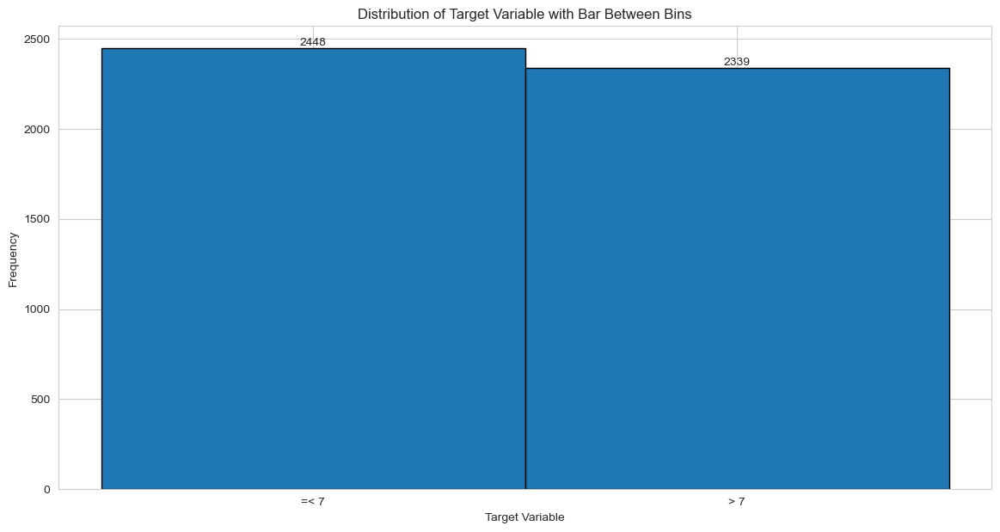

In [174]:
# printing a histogram of the target variable
plt.hist(baseline_dataset['target'], bins=[-0.5, 0.5, 1.5], edgecolor='black')
plt.xlabel('Target Variable')
plt.ylabel('Frequency')
plt.title('Distribution of Target Variable with Bar Between Bins')
plt.xticks([0, 1], ['=< 7', '> 7'])
plt.dpi = 300
for i in range(len(baseline_dataset['target'].value_counts())):
    plt.text(i, baseline_dataset['target'].value_counts().iloc[i], str(baseline_dataset['target'].value_counts().iloc[i]), ha='center', va='bottom')
plt.show()

In [175]:
# the baseline dataset is now complete with the relevant features
# this dataset will be used in testing as the baseline dataset
# the dataset will be saved to a csv file
baseline_dataset.to_csv('/Users/kevinduquesnoy/Documents/DSS/Thesis/Coding work/Datasets/LISS/baseline_dataset.csv', sep=';', index=True)

## 1.5 Creating the health dataset

In [176]:
# the health-related features will now be added into a new seperate dataset
#the basis is the baseline dataset, to which new features will be added
health_dataset = baseline_dataset.copy()

# self-rated health
# based on ch24q004
# add the value to the health dataset
health_dataset = health_dataset.join(
    dataframes_dict['health'][['ch24q004']].rename(columns={'ch24q004': 'self_rated_health'}),
    how='inner'
)

# mental health
# based on ch24q011, ch24q012
# sum the values of these variables
# join the rows where the index is in both dataframes
health_dataset = health_dataset.join(
    dataframes_dict['health'][['ch24q011', 'ch24q012']].sum(axis=1).rename('mental_health'),
    how='inner'
)

# chronic disease
# based on ch24q018
# 1 = yes, 2 = no, output is 1 = yes, 0 = no
# join the rows where the index is in both dataframes
health_dataset = health_dataset.join(
    dataframes_dict['health'][['ch24q018']].applymap(lambda x: 1 if x == 1 else 0).rename(columns={'ch24q018': 'chronic_disease'}),
    how='inner'
)

# behavior 
# based on ch24q125, ch24q133, ch24q159, ch24q160, ch24q161, ch24q162, ch24q163, ch24q270
# input: ch24q125; 1 = 1, 2 = 0, ch24q133; !=8 = 1, 8 = 0, if any of the other variables are 1, the value is 1, else 0
# a total of three is possible on a scale of 0-3, 1 from 125, 1 from 133, and 1 from the other variables
# join the rows where the index is in both dataframes

behavior_score = (
    dataframes_dict['health']['ch24q125'].apply(lambda x: 1 if x == 1 else 0) +
    dataframes_dict['health']['ch24q133'].apply(lambda x: 1 if x != 8 else 0) +
    dataframes_dict['health'][['ch24q159', 'ch24q160', 'ch24q161', 'ch24q162', 'ch24q163', 'ch24q270']].applymap(lambda x: 1 if x == 1 else 0).max(axis=1)
)
health_dataset = health_dataset.join(behavior_score.rename('behavior'), how='inner')

# physical activity
# based on ch24q023, ch24q024, ch24q025, ch24q026, ch24q027, ch24q028, ch24q029, ch24q030, ch24q031, ch24q032, ch24q033, ch24q034, ch24q044
# add up all the values, a high score indicates a high level of physical strain for regular activity
# join the rows where the index is in both dataframes
physical_activity_score = dataframes_dict['health'][['ch24q023', 'ch24q024', 'ch24q025', 'ch24q026', 'ch24q027', 'ch24q028', 'ch24q029', 'ch24q030', 'ch24q031', 'ch24q032', 'ch24q033', 'ch24q034', 'ch24q044']].sum(axis=1)
health_dataset = health_dataset.join(physical_activity_score.rename('physical_activity'), how='inner')

/var/folders/hk/gkxw9p6d3wb6_vcyr1zh90780000gn/T/ipykernel_14321/382280027.py:27: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  dataframes_dict['health'][['ch24q018']].applymap(lambda x: 1 if x == 1 else 0).rename(columns={'ch24q018': 'chronic_disease'}),
/var/folders/hk/gkxw9p6d3wb6_vcyr1zh90780000gn/T/ipykernel_14321/382280027.py:40: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  dataframes_dict['health'][['ch24q159', 'ch24q160', 'ch24q161', 'ch24q162', 'ch24q163', 'ch24q270']].applymap(lambda x: 1 if x == 1 else 0).max(axis=1)


In [177]:
# with the health set now too complete, the dataset will be saved to a csv file
health_dataset.to_csv('/Users/kevinduquesnoy/Documents/DSS/Thesis/Coding work/Datasets/LISS/health_dataset.csv', sep=';', index=True)


# 2. Model prediction for baseline data

## Pre-processing

In [178]:
# train test split of baseline dataset
# Split the dataset into training and testing sets

X_train, X_test, y_train, y_test = train_test_split(
    baseline_dataset.drop(columns=['target']),
    baseline_dataset['target'],
    test_size=0.2,
    random_state=14
)

# to test everything works quickly, the training dataset will be reduced
# X_train = X_train.sample(frac=0.01, random_state=14)
# y_train = y_train.sample(frac=0.01, random_state=14)


In [182]:
# standardize the data

# Initialize the StandardScaler
scaler = StandardScaler()
# Fit the scaler to the training data
scaler.fit(X_train)
# Transform the training and testing data
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)
# Return the scaled data to a dataframe
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns, index=X_train.index)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns, index=X_test.index)


## Preparing the CV loops

In [75]:
# defining models

# defining the models that will be used in the loops
# Dummy classifier
dummy_clf = DummyClassifier(strategy='most_frequent', random_state=14)
# Random Forest classifier
rf_clf = RandomForestClassifier(random_state=14)
# SVM classifier
svm_clf = SVC(random_state=14)
# CatBoost classifier
catboost_clf = CatBoostClassifier(random_state=14, verbose=0)

# defining the hyperparameter grids for the models

# Random Forest classifier hyperparameter grid
rf_param_grid = {
    'n_estimators': [10, 100, 500, 1000],
    'max_features': ['sqrt', 'log2'],
    'criterion': ['gini', 'entropy']
}

# CatBoost classifier hyperparameter grid
catboost_param_grid = {
    'iterations': [100, 200, 300, 1000],
    'learning_rate': [0.01, 0.05, 0.1],
    'l2_leaf_reg': [1, 3, 5, 10]
}

# SVM classifier hyperparameter grid
svm_param_grid = {
    'C': [0.001, 0.01, 0.1, 1],
    'kernel': ['linear', 'rbf', 'poly'],
    'gamma': [0.0001, 0.001, 0.01, 0.1],
}

# defining the models and their hyperparameter grids in a dictionary
models = {
    'RandomForestClassifier': (rf_clf, rf_param_grid),
    'SVC': (svm_clf, svm_param_grid),
    'CatBoostClassifier': (catboost_clf, catboost_param_grid)
}


In [76]:
# creating the loops
Inner_folds = 5
Outer_folds = 5

# Initialize the KFold object for outer cross-validation
outer_cv = KFold(n_splits=Outer_folds, shuffle=True, random_state=14)
Inner_cv = KFold(n_splits=Inner_folds, shuffle=True, random_state=14)

# Initialize a dictionary to store the results
results = {}




## Dummy classifier

In [77]:
# predicting with the dummy classifier
from sklearn.metrics import f1_score, precision_score, recall_score, roc_auc_score
dummy_clf.fit(X_train_scaled, y_train)
dummy_pred = dummy_clf.predict(X_test_scaled)
dummy_accuracy = dummy_clf.score(X_test_scaled, y_test)



## Going through nested CV for RF, CB, SVM to train them and tune hyperparameters

In [78]:
# RF classifier
search_RF = HalvingGridSearchCV(estimator=rf_clf, param_grid=rf_param_grid, scoring='f1', cv=Inner_cv, random_state=14, refit = True, verbose = 1, aggressive_elimination=True, factor = 5, n_jobs=-1)
nested_RF_scores = cross_val_score(search_RF, X_train_scaled, y_train, cv=outer_cv, scoring='f1')
print(f"Nested CV F1 Score for Random Forest: {nested_RF_scores.mean():.4f} ± {nested_RF_scores.std():.4f}")
search_RF.fit(X_train_scaled, y_train)
print(search_RF.best_params_)
RF_results = {
    'Model': 'RandomForestClassifier',
    'Accuracy': search_RF.score(X_test_scaled, y_test),
    'F1 Score': f1_score(y_test, search_RF.predict(X_test_scaled)),
    'Precision': precision_score(y_test, search_RF.predict(X_test_scaled)),
    'Recall': recall_score(y_test, search_RF.predict(X_test_scaled)),
    'ROC AUC Score': roc_auc_score(y_test, search_RF.predict(X_test_scaled))
}


n_iterations: 2
n_required_iterations: 2
n_possible_iterations: 2
min_resources_: 612
max_resources_: 3063
aggressive_elimination: True
factor: 5
----------
iter: 0
n_candidates: 16
n_resources: 612
Fitting 5 folds for each of 16 candidates, totalling 80 fits


/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


----------
iter: 1
n_candidates: 4
n_resources: 3060
Fitting 5 folds for each of 4 candidates, totalling 20 fits
n_iterations: 2
n_required_iterations: 2
n_possible_iterations: 2
min_resources_: 612
max_resources_: 3063
aggressive_elimination: True
factor: 5
----------
iter: 0
n_candidates: 16
n_resources: 612
Fitting 5 folds for each of 16 candidates, totalling 80 fits
----------
iter: 1
n_candidates: 4
n_resources: 3060
Fitting 5 folds for each of 4 candidates, totalling 20 fits
n_iterations: 2
n_required_iterations: 2
n_possible_iterations: 2
min_resources_: 612
max_resources_: 3063
aggressive_elimination: True
factor: 5
----------
iter: 0
n_candidates: 16
n_resources: 612
Fitting 5 folds for each of 16 candidates, totalling 80 fits
----------
iter: 1
n_candidates: 4
n_resources: 3060
Fitting 5 folds for each of 4 candidates, totalling 20 fits
n_iterations: 2
n_required_iterations: 2
n_possible_iterations: 2
min_resources_: 612
max_resources_: 3063
aggressive_elimination: True
facto

In [79]:
# CatBoost classifier
search_CatBoost = HalvingGridSearchCV(estimator=catboost_clf, param_grid=catboost_param_grid, scoring='f1', cv=Inner_cv, random_state=14, refit = True, verbose = 2, aggressive_elimination=True, factor = 5, n_jobs=-1)
nested_CatBoost_scores = cross_val_score(search_CatBoost, X_train_scaled, y_train, cv=outer_cv, scoring='f1')
print(f"Nested CV F1 Score for CatBoost: {nested_CatBoost_scores.mean():.4f} ± {nested_CatBoost_scores.std():.4f}")
search_CatBoost.fit(X_train_scaled, y_train, verbose=1)
print(search_CatBoost.best_params_)
CatBoost_results = {
    'Model': 'CatBoostClassifier',
    'Accuracy': search_CatBoost.score(X_test_scaled, y_test),
    'F1 Score': f1_score(y_test, search_CatBoost.predict(X_test_scaled)),
    'Precision': precision_score(y_test, search_CatBoost.predict(X_test_scaled)),
    'Recall': recall_score(y_test, search_CatBoost.predict(X_test_scaled)),
    'ROC AUC Score': roc_auc_score(y_test, search_CatBoost.predict(X_test_scaled))
}

n_iterations: 3
n_required_iterations: 3
n_possible_iterations: 3
min_resources_: 122
max_resources_: 3063
aggressive_elimination: True
factor: 5
----------
iter: 0
n_candidates: 48
n_resources: 122
Fitting 5 folds for each of 48 candidates, totalling 240 fits
[CV] END ..iterations=100, l2_leaf_reg=1, learning_rate=0.01; total time=   0.6s
[CV] END ..iterations=100, l2_leaf_reg=1, learning_rate=0.01; total time=   0.6s
[CV] END ..iterations=100, l2_leaf_reg=1, learning_rate=0.01; total time=   0.6s
[CV] END ..iterations=100, l2_leaf_reg=1, learning_rate=0.01; total time=   0.6s
[CV] END ..iterations=100, l2_leaf_reg=1, learning_rate=0.01; total time=   0.3s
[CV] END ..iterations=100, l2_leaf_reg=1, learning_rate=0.05; total time=   0.4s
[CV] END ..iterations=100, l2_leaf_reg=1, learning_rate=0.05; total time=   0.3s
[CV] END ..iterations=100, l2_leaf_reg=1, learning_rate=0.05; total time=   0.3s
[CV] END ...iterations=100, l2_leaf_reg=1, learning_rate=0.1; total time=   0.4s
[CV] END .

In [80]:
# SVM classifier
search_SVM = HalvingGridSearchCV(estimator=svm_clf, param_grid=svm_param_grid, scoring='f1', cv=Inner_cv, random_state=14, refit = True, verbose = 2, aggressive_elimination=False, factor = 3, n_jobs=-1)
nested_SVM_scores = cross_val_score(search_SVM, X_train_scaled, y_train, cv=outer_cv, scoring='f1')
print(f"Nested CV F1 Score for SVM: {nested_SVM_scores.mean():.4f} ± {nested_SVM_scores.std():.4f}")
search_SVM.fit(X_train_scaled, y_train)
print(search_SVM.best_params_)
SVM_results = {
    'Model': 'SVC',
    'Accuracy': search_SVM.score(X_test_scaled, y_test),
    'F1 Score': f1_score(y_test, search_SVM.predict(X_test_scaled)),
    'Precision': precision_score(y_test, search_SVM.predict(X_test_scaled)),
    'Recall': recall_score(y_test, search_SVM.predict(X_test_scaled)),
    'ROC AUC Score': roc_auc_score(y_test, search_SVM.predict(X_test_scaled))
}


n_iterations: 4
n_required_iterations: 4
n_possible_iterations: 4
min_resources_: 113
max_resources_: 3063
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 48
n_resources: 113
Fitting 5 folds for each of 48 candidates, totalling 240 fits
[CV] END ...............C=0.001, gamma=0.0001, kernel=linear; total time=   0.0s
[CV] END ...............C=0.001, gamma=0.0001, kernel=linear; total time=   0.0s
[CV] END ...............C=0.001, gamma=0.0001, kernel=linear; total time=   0.0s
[CV] END ...............C=0.001, gamma=0.0001, kernel=linear; total time=   0.0s
[CV] END ...............C=0.001, gamma=0.0001, kernel=linear; total time=   0.0s
[CV] END ..................C=0.001, gamma=0.0001, kernel=rbf; total time=   0.0s
[CV] END ..................C=0.001, gamma=0.0001, kernel=rbf; total time=   0.0s
[CV] END .................C=0.001, gamma=0.0001, kernel=poly; total time=   0.0s
[CV] END ..................C=0.001, gamma=0.0001, kernel=rbf; total time=   0.0s
[CV] END 

In [81]:
# Training the best performing versions of all models on unseen data and final prediction
# Dummy classifier
dummy_clf.fit(X_train_scaled, y_train)
dummy_pred = dummy_clf.predict(X_test_scaled)

# # Random Forest classifier
rf_clf.set_params(**search_RF.best_params_)
rf_clf.fit(X_train_scaled, y_train)
rf_pred = rf_clf.predict(X_test_scaled)

# CatBoost classifier
catboost_clf.set_params(**search_CatBoost.best_params_)
catboost_clf.fit(X_train_scaled, y_train)
catboost_pred = catboost_clf.predict(X_test_scaled)

# SVM classifier
svm_clf.set_params(**search_SVM.best_params_)
svm_clf.fit(X_train_scaled, y_train)
svm_pred = svm_clf.predict(X_test_scaled)

## Training and validating the AFC model

In [93]:
# AFC training

print("Setting up advanced AFC model training block...")

# --- 1. Define Helper Functions and Callback Class ---

def advanced_optimizer_constructor(
    model, 
    initial_lr=0.001, 
    model_type_tag="predictor"
    ):
    """
    Creates a TensorFlow Adam optimizer for the given Keras model,
    with a specified initial learning rate.
    The learning rate will be dynamically updated by the callback.
    """
    optimizer = tf.keras.optimizers.Adam(learning_rate=initial_lr)
    # print(f"Optimizer created for Keras model ({model_type_tag}) with initial LR: {initial_lr:.6f}")
    return optimizer

# Global-like dictionary to hold callback state for a single training run.
# Re-initialize this before each new training run if fitting multiple times.
adv_afc_callback_state = {} 

def advanced_validate_for_afc_callback(
    afc_model_to_validate, X_val_data_np, y_val_data_series,
    sf_val_data_np, # Expecting a single sensitive feature (e.g., income) for validation DPD
    pos_label_val, 
    metric_func_val=f1_score, average_type_val='weighted'):
    """Validates the AFC model during callback."""
    predictions_on_val = afc_model_to_validate.predict(X_val_data_np)
    y_val_np_flat_val = y_val_data_series.to_numpy().ravel() if isinstance(y_val_data_series, pd.Series) else np.array(y_val_data_series).ravel()

    main_metric_val = metric_func_val(y_val_np_flat_val, predictions_on_val, average=average_type_val, zero_division=0)
    accuracy_on_val = accuracy_score(y_val_np_flat_val, predictions_on_val)
    selection_rate_on_val = np.mean(predictions_on_val == pos_label_val)
    
    dp_diff_on_val = np.nan
    if sf_val_data_np is not None and len(np.unique(sf_val_data_np)) >= 2:
        try:
            dp_diff_on_val = demographic_parity_difference(
                y_val_np_flat_val == pos_label_val,
                predictions_on_val == pos_label_val,
                sensitive_features=sf_val_data_np.ravel() 
            )
        except Exception: pass # Silently pass DPD calculation errors during callback
            
    print(
        f"  Validation - Metric ({metric_func_val.__name__}): {main_metric_val:.4f}, "
        f"Accuracy: {accuracy_on_val:.4f}, DP Diff: {dp_diff_on_val:.4f}, Sel. Rate: {selection_rate_on_val:.4f}"
    )
    return main_metric_val, dp_diff_on_val, accuracy_on_val, selection_rate_on_val

class AdvancedAFCTrainingCallback:
    def __init__(self, X_val_np, y_val_series, sf_val_np, pos_label,
                 alpha_min=0.001, alpha_max=0.5, alpha_ramp_steps=5000,
                 lr_decay_factor=0.985,
                 val_frequency_steps=100, 
                 early_stop_metric_func=f1_score, 
                 early_stop_patience_checks=5, 
                 early_stop_min_delta=0.005,
                 es_acc_thresh=0.60, es_dp_diff_thresh=0.20, 
                 es_sel_rate_min=0.05, es_sel_rate_max=0.95,
                 verbose_callback=True):
        
        self.X_val_np = X_val_np
        self.y_val_series = y_val_series
        self.sf_val_np = sf_val_np 
        self.pos_label = pos_label
        self.alpha_min = alpha_min
        self.alpha_max = alpha_max
        self.alpha_ramp_steps = alpha_ramp_steps
        self.lr_decay_factor = lr_decay_factor
        self.val_frequency_steps = val_frequency_steps
        self.early_stop_metric_func = early_stop_metric_func
        self.early_stop_patience_checks = early_stop_patience_checks
        self.early_stop_min_delta = early_stop_min_delta
        self.es_acc_thresh = es_acc_thresh
        self.es_dp_diff_thresh = es_dp_diff_thresh
        self.es_sel_rate_min = es_sel_rate_min
        self.es_sel_rate_max = es_sel_rate_max
        self.verbose_callback = verbose_callback
        self.best_val_score = -np.inf
        self.checks_without_improvement = 0

    def __call__(self, model, step, X, y, z, pos_label, sample_weight=None): 
        if self.verbose_callback and step > 0 and step % (self.val_frequency_steps // 10 or 1) == 0 :
             # print(f"  Callback invoked at step {step}.") # More frequent log if needed
             pass

        if step < self.alpha_ramp_steps:
            calculated_alpha = self.alpha_min + \
                               (self.alpha_max - self.alpha_min) * (step / self.alpha_ramp_steps)
        else:
            calculated_alpha = self.alpha_max
        model.alpha = calculated_alpha 
        
        if step > 0 and step % self.val_frequency_steps == 0:
            if self.verbose_callback:
                print(f"\nCallback at step {step}: Alpha set to {model.alpha:.4f}")

            new_lr_for_print = "N/A" 
            try:
                for optimizer_attr_name_key in ['predictor_model_', 'adversary_model_']:
                    backend_keras_model = getattr(model.backend_, optimizer_attr_name_key, None)
                    if backend_keras_model and hasattr(backend_keras_model, 'optimizer') and \
                       hasattr(backend_keras_model.optimizer, 'learning_rate'):
                        opt_cb = backend_keras_model.optimizer
                        current_lr_cb = opt_cb.learning_rate.numpy()
                        new_lr_cb = current_lr_cb * self.lr_decay_factor
                        opt_cb.learning_rate.assign(new_lr_cb)
                        new_lr_for_print = f"{new_lr_cb:.7f}" 
                if new_lr_for_print != "N/A" and self.verbose_callback: 
                     print(f"  LRs updated (decay factor: {self.lr_decay_factor}). New approx LR: {new_lr_for_print}")
            except Exception as e_lr_cb:
                if self.verbose_callback:
                    print(f"  Warning: Error updating learning rate in callback: {e_lr_cb}")

            if self.X_val_np is None or self.y_val_series is None:
                 if self.verbose_callback:
                     print("  Skipping validation in callback: Validation data not provided.")
                 return False 

            sf_val_dict_metric = {'income_for_dpd': self.sf_val_np} 
            val_score_cb, dp_diff_cb, acc_cb, sel_rate_cb = advanced_validate_for_afc_callback(
                model, self.X_val_np, self.y_val_series, 
                sf_val_dict_metric, self.pos_label, 
                metric_func_val=self.early_stop_metric_func
            )

            complex_stop = False
            if not np.isnan(dp_diff_cb) and dp_diff_cb < self.es_dp_diff_thresh and \
               acc_cb > self.es_acc_thresh and \
               sel_rate_cb > self.es_sel_rate_min and sel_rate_cb < self.es_sel_rate_max:
                if self.verbose_callback: print(f"  Complex early stopping condition met!")
                complex_stop = True

            patience_stop = False
            if val_score_cb > self.best_val_score + self.early_stop_min_delta:
                self.best_val_score = val_score_cb
                self.checks_without_improvement = 0
                if self.verbose_callback: print(f"  New best validation metric: {val_score_cb:.4f}. Resetting patience.")
            else:
                self.checks_without_improvement += 1
                if self.verbose_callback: 
                    print(f"  No improvement ({self.early_stop_metric_func.__name__}) for {self.checks_without_improvement} check(s).")

            if self.checks_without_improvement >= self.early_stop_patience_checks:
                if self.verbose_callback: print(f"  Patience-based early stopping triggered.")
                patience_stop = True
            
            if complex_stop or patience_stop: return True
                
        return False

# --- Main Script for Training the AFC Model (Health Dataset) ---

y_cv_health = y_train 
sf_cv_health_for_training = X_train_scaled[['income']] 
main_feature_names_health = X_cv_main_features_health.columns.tolist()
X_main_holdout_test_health = X_test_scaled
y_holdout_test_health = y_test
all_sf_holdout_test_health = X_test_scaled['income']
all_sensitive_feature_names_for_eval_health = ['income'] 




print("\n--- Preparing Data for Final Advanced AFC Training (Health Dataset) ---")

POS_LABEL_HEALTH = 1 

# Create a validation split from X_cv_main_features_health for the callback
VAL_PROPORTION_AFC = 0.20 
use_adv_afc_callback_validation = False
X_val_for_callback_np_final, y_val_for_callback_series_final, sf_val_for_callback_np_final = None, None, None
X_train_afc_np_scaled_final, y_train_afc_final_labels, sf_train_afc_np_income_final = None, None, None
scaler_for_final_afc = MinMaxScaler() # This scaler will be fit on the sub-training data

# Check if prerequisite data is available
if 'X_cv_main_features_health' not in locals() or X_cv_main_features_health is None or \
   'y_cv_health' not in locals() or y_cv_health is None or \
   'sf_cv_health_for_training' not in locals() or sf_cv_health_for_training is None:
    print("ERROR: Essential training data (X_cv_main_features_health, y_cv_health, or sf_cv_health_for_training) is not defined. Cannot proceed.")
    final_AFC_model_health = None # Ensure model is None
else:
    if X_cv_main_features_health.shape[0] * VAL_PROPORTION_AFC >= 2 and \
       sf_cv_health_for_training.shape[0] * VAL_PROPORTION_AFC >= 2:
        
        print(f"Splitting X_cv_main_features_health for training and validation (val_proportion={VAL_PROPORTION_AFC})")
        X_train_afc_final_main, X_val_afc_df_main, \
        y_train_afc_final_labels, y_val_for_callback_series_final, \
        sf_train_afc_final_income_df, sf_val_afc_income_for_cb_df = train_test_split(
            X_cv_main_features_health, 
            y_cv_health,               
            sf_cv_health_for_training, # This is the 'income' Series/DataFrame for AFC training SF
            test_size=VAL_PROPORTION_AFC,
            random_state=14, 
            stratify=y_cv_health
        )
        use_adv_afc_callback_validation = True

        X_train_afc_np_scaled_final = scaler_for_final_afc.fit_transform(X_train_afc_final_main).astype(np.float32)
        X_train_afc_np_scaled_final = np.clip(X_train_afc_np_scaled_final, 0, 1)

        X_val_for_callback_np_final = scaler_for_final_afc.transform(X_val_afc_df_main).astype(np.float32)
        X_val_for_callback_np_final = np.clip(X_val_for_callback_np_final, 0, 1)

        sf_train_afc_np_income_final = sf_train_afc_final_income_df.astype(np.float32).to_numpy().reshape(-1, 1)
        sf_val_for_callback_np_final = sf_val_afc_income_for_cb_df.astype(np.float32).to_numpy().reshape(-1, 1)
        
        print(f"Final AFC Train shapes: X-{X_train_afc_np_scaled_final.shape}, y-{y_train_afc_final_labels.shape}, sf_income-{sf_train_afc_np_income_final.shape}")
        print(f"Callback Validation shapes: X-{X_val_for_callback_np_final.shape}, y-{y_val_for_callback_series_final.shape}, sf_income-{sf_val_for_callback_np_final.shape}")
    else:
        print("Warning: Training dataset too small or SFs not suitable for validation split. Disabling callback validation.")
        # Train on the full X_cv_main_features_health if no validation split
        X_train_afc_np_scaled_final = scaler_for_final_afc.fit_transform(X_cv_main_features_health).astype(np.float32)
        X_train_afc_np_scaled_final = np.clip(X_train_afc_np_scaled_final, 0, 1)
        y_train_afc_final_labels = y_cv_health.copy()
        sf_train_afc_np_income_final = sf_cv_health_for_training.astype(np.float32).to_numpy().reshape(-1,1)
        print(f"Training AFC on full X_cv_main_features_health (shape: {X_train_afc_np_scaled_final.shape}).")

    # --- Define AFC Model Parameters and Instantiate ---
    afc_final_predictor_structure = [64, 32] 
    afc_final_adversary_structure = [3, 'leaky_relu']    
    afc_final_total_epochs = 2000 # Max epochs if not stopped early
    afc_final_batch_size = 128
    afc_final_initial_lr = 0.001 
    afc_final_initial_alpha = 0.001

    afc_callback_instance = None
    if use_adv_afc_callback_validation:
        # Reset callback state for this training run
        adv_afc_callback_state = { 
            "best_val_score": -np.inf, 
            "stages_without_improvement": 0,
        }
        afc_callback_instance = AdvancedAFCTrainingCallback(
            X_val_np=X_val_for_callback_np_final, 
            y_val_series=y_val_for_callback_series_final, 
            sf_val_np=sf_val_for_callback_np_final, 
            pos_label=POS_LABEL_HEALTH,
            verbose_callback=True # Set to True for more printouts from callback
        )
        print("Advanced AFC callback instance created.")
    else:
        print("Callback validation disabled. AFC will run for full epochs; alpha will update but LR won't decay via callback.")

    print("\n--- Instantiating Final AdversarialFairnessClassifier ---")
    predictor_opt_constructor_partial = partial(advanced_optimizer_constructor, 
                                                initial_lr=afc_final_initial_lr, 
                                                model_type_tag="predictor_final_health")
    adversary_opt_constructor_partial = partial(advanced_optimizer_constructor, 
                                                initial_lr=afc_final_initial_lr, 
                                                model_type_tag="adversary_final_health")

    final_AFC_model = AdversarialFairnessClassifier(
        predictor_model=afc_final_predictor_structure,
        adversary_model=afc_final_adversary_structure,
        predictor_optimizer=predictor_opt_constructor_partial,
        adversary_optimizer=adversary_opt_constructor_partial,
        epochs=afc_final_total_epochs,
        batch_size=afc_final_batch_size,
        callbacks= afc_callback_instance,
        backend='tensorflow',
        random_state=14, 
        alpha=afc_final_initial_alpha 
        )


    # --- Fit the Final AFC Model ---
    if X_train_afc_np_scaled_final is not None :
        print(f"\n--- Fitting Final AFC Model (max {afc_final_total_epochs} epochs) ---")
        try:
            final_AFC_model.fit(
                X_train_afc_np_scaled_final,
                y_train_afc_final_labels, 
                sensitive_features=sf_train_afc_np_income_final 
            )
            print("\nSuccessfully trained final AFC model with custom callbacks.")
            print(f"  Final alpha in model: {final_AFC_model.alpha:.4f}")
            # The 'scaler_for_final_afc' is also an important artifact if you need to reuse it.
            # It was fitted on the (sub)training data used by this AFC model.

        except Exception as e_fit_final_custom_afc:
            print(f"Final custom AFC model training FAILED: {type(e_fit_final_custom_afc).__name__} - {e_fit_final_custom_afc}")
            final_AFC_model = None # Ensure model is None if training failed
    else:
        # This case should ideally be caught by the initial check for X_cv_main_features_health
        print("ERROR: Training data for AFC (X_train_afc_np_scaled_final) was not prepared. Skipping fit.")
        final_AFC_model = None

# --- Post-Training ---
if 'final_AFC_model_health' in locals() and final_AFC_model is not None:
    print("\n--- AFC Model Training Complete ---")
    print("The trained model is available in the variable 'final_AFC_model_health'.")
    print("The scaler used for its training data is 'scaler_for_final_afc'.")
else:
    print("\n--- AFC Model Training Incomplete or Failed ---")
    print("The 'final_AFC_model_health' variable is not available or is None.")

Setting up advanced AFC model training block...

--- Preparing Data for Final Advanced AFC Training (Health Dataset) ---
Splitting X_cv_main_features_health for training and validation (val_proportion=0.2)
Final AFC Train shapes: X-(3063, 14), y-(3063,), sf_income-(3063, 1)
Callback Validation shapes: X-(766, 14), y-(766,), sf_income-(766, 1)
Advanced AFC callback instance created.

--- Instantiating Final AdversarialFairnessClassifier ---

--- Fitting Final AFC Model (max 2000 epochs) ---

Callback at step 100: Alpha set to 0.0110
  Validation - Metric (f1_score): 0.6044, Accuracy: 0.6044, DP Diff: nan, Sel. Rate: 0.5078
  New best validation metric: 0.6044. Resetting patience.

Callback at step 200: Alpha set to 0.0210
  Validation - Metric (f1_score): 0.6122, Accuracy: 0.6136, DP Diff: nan, Sel. Rate: 0.5614
  New best validation metric: 0.6122. Resetting patience.

Callback at step 300: Alpha set to 0.0309
  Validation - Metric (f1_score): 0.6010, Accuracy: 0.6044, DP Diff: nan, Se

# 3. Evaluating the results for baseline data

## Scoring

In [103]:

# Evaluation 

# Determine sensitive features for evaluation
# sensitive_features_list = ['religious', 'income', 'education', 'employment_status']  
sensitive_features_list = ['income']
# Dummy classifier
dummy_eval = {
    'Model': 'DummyClassifier',
    'Accuracy': dummy_clf.score(X_test_scaled, y_test),
    'F1 Score': f1_score(y_test, dummy_clf.predict(X_test_scaled)),
    'Precision': precision_score(y_test, dummy_clf.predict(X_test_scaled)),
    'Recall': recall_score(y_test, dummy_clf.predict(X_test_scaled)),
    'ROC AUC Score': roc_auc_score(y_test, dummy_clf.predict(X_test_scaled))
}


# Random Forest classifier
rf_clf.fit(X_train_scaled, y_train)
RF_eval = {
    'Model': 'RandomForestClassifier',
    'Accuracy': rf_clf.score(X_test_scaled, y_test),
    'F1 Score': f1_score(y_test, rf_clf.predict(X_test_scaled)),
    'Precision': precision_score(y_test, rf_clf.predict(X_test_scaled)),
    'Recall': recall_score(y_test, rf_clf.predict(X_test_scaled)),
    'ROC AUC Score': roc_auc_score(y_test, rf_clf.predict(X_test_scaled)),
    'Demographic Parity': demographic_parity_difference(y_test, rf_clf.predict(X_test_scaled), sensitive_features=X_test_scaled[sensitive_features_list]),
    'Equalized Odds': equalized_odds_difference(y_test, rf_clf.predict(X_test_scaled), sensitive_features=X_test_scaled[sensitive_features_list])
}


# CatBoost classifier
catboost_clf.fit(X_train_scaled, y_train)
CatBoost_eval = {
    'Model': 'CatBoostClassifier',
    'Accuracy': catboost_clf.score(X_test_scaled, y_test),
    'F1 Score': f1_score(y_test, catboost_clf.predict(X_test_scaled)),
    'Precision': precision_score(y_test, catboost_clf.predict(X_test_scaled)),
    'Recall': recall_score(y_test, catboost_clf.predict(X_test_scaled)),
    'ROC AUC Score': roc_auc_score(y_test, catboost_clf.predict(X_test_scaled)),
    'Demographic Parity': demographic_parity_difference(y_test, catboost_clf.predict(X_test_scaled), sensitive_features=X_test_scaled[sensitive_features_list]),
    'Equalized Odds': equalized_odds_difference(y_test, catboost_clf.predict(X_test_scaled), sensitive_features=X_test_scaled[sensitive_features_list])
}

# SVM classifier
svm_clf.fit(X_train_scaled, y_train)
SVM_eval = {
    'Model': 'SVC',
    'Accuracy': svm_clf.score(X_test_scaled, y_test),
    'F1 Score': f1_score(y_test, svm_clf.predict(X_test_scaled)),
    'Precision': precision_score(y_test, svm_clf.predict(X_test_scaled)),
    'Recall': recall_score(y_test, svm_clf.predict(X_test_scaled)),
    'ROC AUC Score': roc_auc_score(y_test, svm_clf.predict(X_test_scaled)),
    'Demographic Parity': demographic_parity_difference(y_test, svm_clf.predict(X_test_scaled), sensitive_features=X_test_scaled[sensitive_features_list]),
    'Equalized Odds': equalized_odds_difference(y_test, svm_clf.predict(X_test_scaled), sensitive_features=X_test_scaled[sensitive_features_list])
}

AFC_eval = {
    'Model': 'AFC',
    'Accuracy': final_AFC_model.score(X_test_scaled, y_test),
    'F1 Score': f1_score(y_test, final_AFC_model.predict(X_test_scaled)),
    'Precision': precision_score(y_test, final_AFC_model.predict(X_test_scaled)),
    'Recall': recall_score(y_test, final_AFC_model.predict(X_test_scaled)),
    'ROC AUC Score': roc_auc_score(y_test, final_AFC_model.predict(X_test_scaled)),
    'Demographic Parity': demographic_parity_difference(y_test, final_AFC_model.predict(X_test_scaled), sensitive_features=X_test_scaled[sensitive_features_list]),
    'Equalized Odds': equalized_odds_difference(y_test, final_AFC_model.predict(X_test_scaled), sensitive_features=X_test_scaled[sensitive_features_list])
}

# Storing the results in a dictionary
results['DummyClassifier'] = dummy_eval
results['RandomForestClassifier'] = RF_eval
results['CatBoostClassifier'] = CatBoost_eval
results['SVC'] = SVM_eval
results['AdversarialFairnessClassifier'] = AFC_eval
# Saving the results to a CSV file
results_df = pd.DataFrame(results)
results_df.to_csv('model_results.csv', index=True)

print(results_df)


/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but AdversarialFairnessClassifier was fitted without feature names
  warnings.warn(
/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but AdversarialFairnessClassifier was fitted without feature names
  warnings.warn(
/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but AdversarialFairnessClassifier was fitted without feature names
  warnings.warn(
/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/sklearn/base.py:457: UserWa

                    DummyClassifier  RandomForestClassifier  \
Model               DummyClassifier  RandomForestClassifier   
Accuracy                   0.521921                0.646138   
F1 Score                        0.0                0.636656   
Precision                       0.0                0.625263   
Recall                          0.0                0.648472   
ROC AUC Score                   0.5                0.646236   
Demographic Parity              NaN                0.576923   
Equalized Odds                  NaN                    0.75   

                    CatBoostClassifier       SVC AdversarialFairnessClassifier  
Model               CatBoostClassifier       SVC                           AFC  
Accuracy                      0.674322  0.641962                      0.577244  
F1 Score                      0.659389  0.635494                      0.634806  
Precision                     0.659389  0.619048                      0.540707  
Recall                     

## Feature importance


Calculating permutation importance for RandomForestClassifier...


/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with f

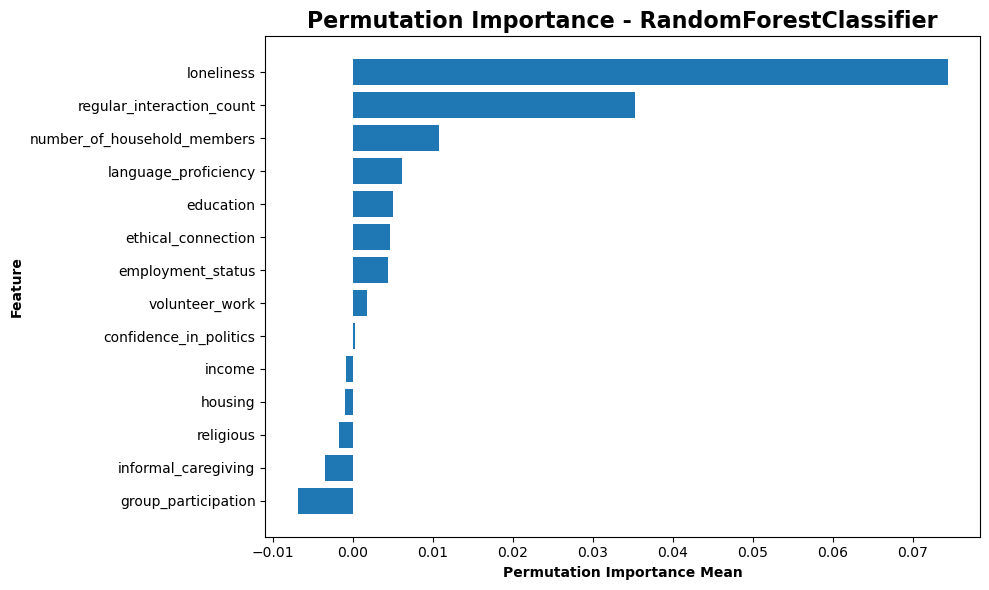


Calculating permutation importance for CatBoostClassifier...


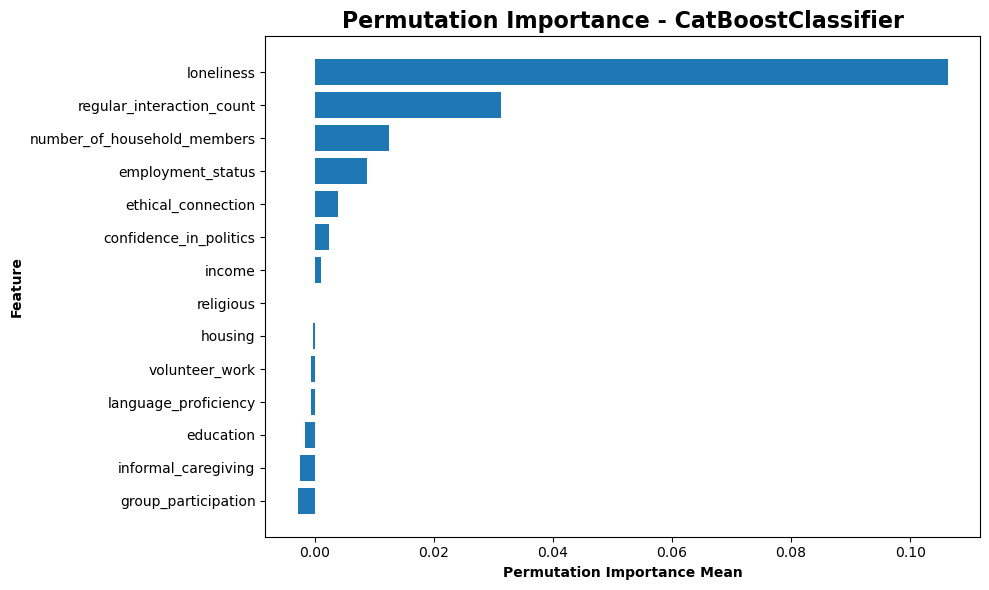


Calculating permutation importance for SVC...


/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/skle

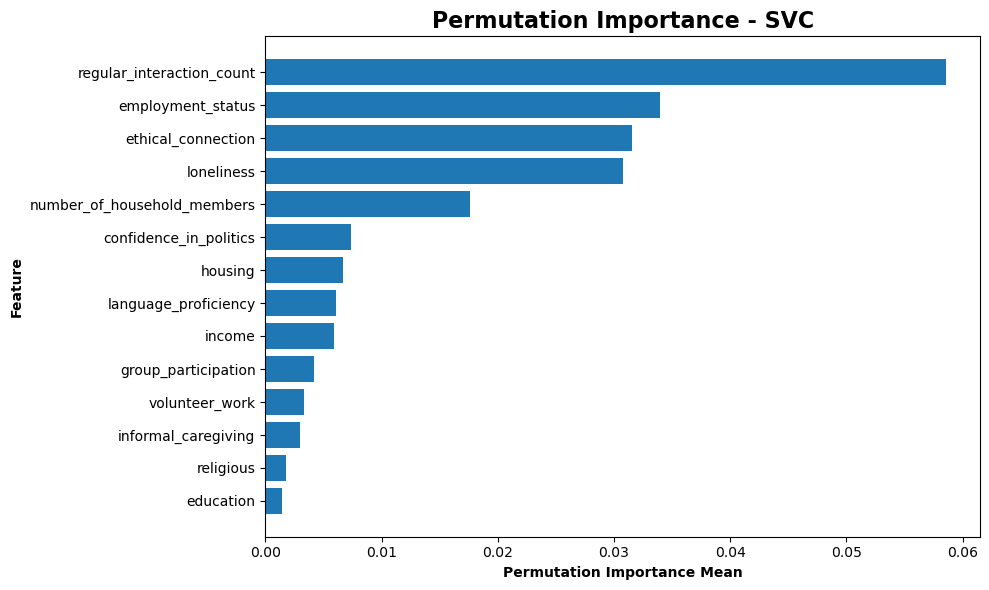


Calculating permutation importance for AdversarialFairnessClassifier...


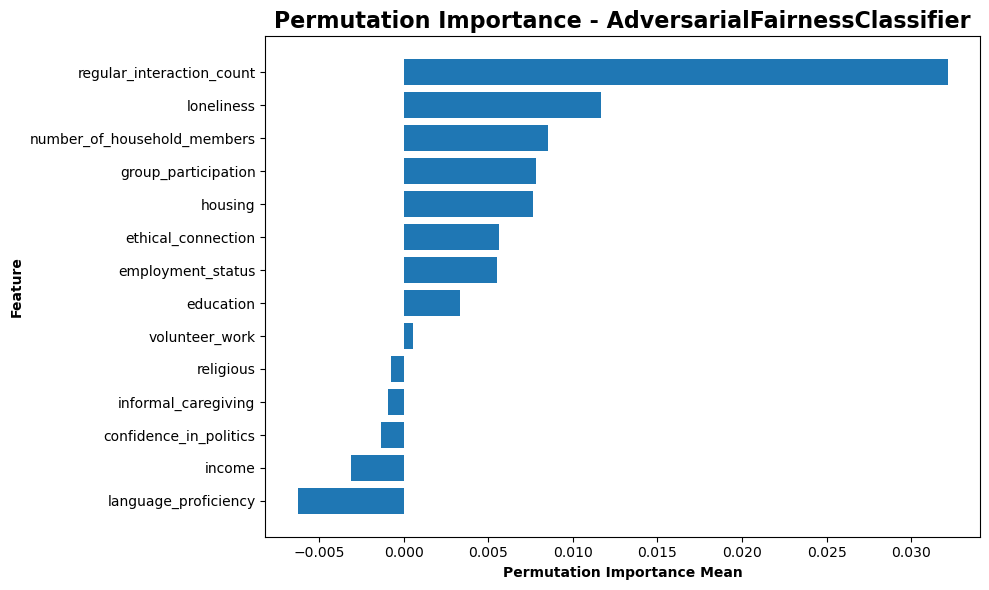

In [104]:
# Feature importance

# Permutation importance of features per model


def plot_permutation_importance(model, X_eval, y_eval, feature_names, model_name, n_repeats=10, random_state=14, n_jobs=1):
    """
    Calculates and plots permutation importance of features.

    Parameters:
    - model: The trained model.
    - X_eval: The evaluation data (features). Can be a NumPy array or pandas DataFrame.
    - y_eval: The true labels for the evaluation data.
    - feature_names: A list of strings representing the feature names, in the same order as columns in X_eval.
    - model_name: String, name of the model for the plot title.
    - n_repeats: Number of times to permute a feature.
    - random_state: Random state for reproducibility.
    """
    print(f"\nCalculating permutation importance for {model_name}...")
    
    # Ensure X_eval is a NumPy array for permutation_importance if model was fit on NumPy
    # This is generally good practice to avoid potential issues with DataFrame indexing within the function
    if isinstance(X_eval, pd.DataFrame):
        X_eval_np = X_eval.to_numpy()
    else:
        X_eval_np = X_eval

    result = permutation_importance(
        model, X_eval_np, y_eval, 
        n_repeats=n_repeats, 
        random_state=random_state,
        n_jobs=1 # Use multiple cores if available
    )
    
    sorted_idx = result.importances_mean.argsort() # Sorts from smallest to largest

    if len(feature_names) != len(result.importances_mean):
        print(f"  WARNING for {model_name}: Number of feature names ({len(feature_names)}) "
              f"does not match number of importances ({len(result.importances_mean)}). "
              "Plotting might be incorrect.")
        # Fallback if lengths don't match - this shouldn't happen if feature_names is correct
        effective_feature_names = [f"Feature {i}" for i in range(len(result.importances_mean))]
    else:
        effective_feature_names = np.array(feature_names)[sorted_idx]

    plt.figure(figsize=(10, max(6, len(effective_feature_names) * 0.4))) # Adjust height based on num features
    plt.barh(effective_feature_names, result.importances_mean[sorted_idx])
    plt.xlabel("Permutation Importance Mean", fontweight='bold')
    plt.ylabel("Feature", fontweight='bold')
    plt.title(f"Permutation Importance - {model_name}", fontweight='bold', fontsize=16)
    plt.tight_layout()
    plt.show()

# Plot permutation importance for each model
plot_permutation_importance(rf_clf, X_test_scaled, y_test, X_test_scaled.columns, 'RandomForestClassifier')
plot_permutation_importance(catboost_clf, X_test_scaled, y_test, X_test_scaled.columns, 'CatBoostClassifier')
plot_permutation_importance(svm_clf, X_test_scaled, y_test, X_test_scaled.columns, 'SVC')
plot_permutation_importance(final_AFC_model, X_test_scaled, y_test, X_test_scaled.columns, 'AdversarialFairnessClassifier')


## Feature correlation

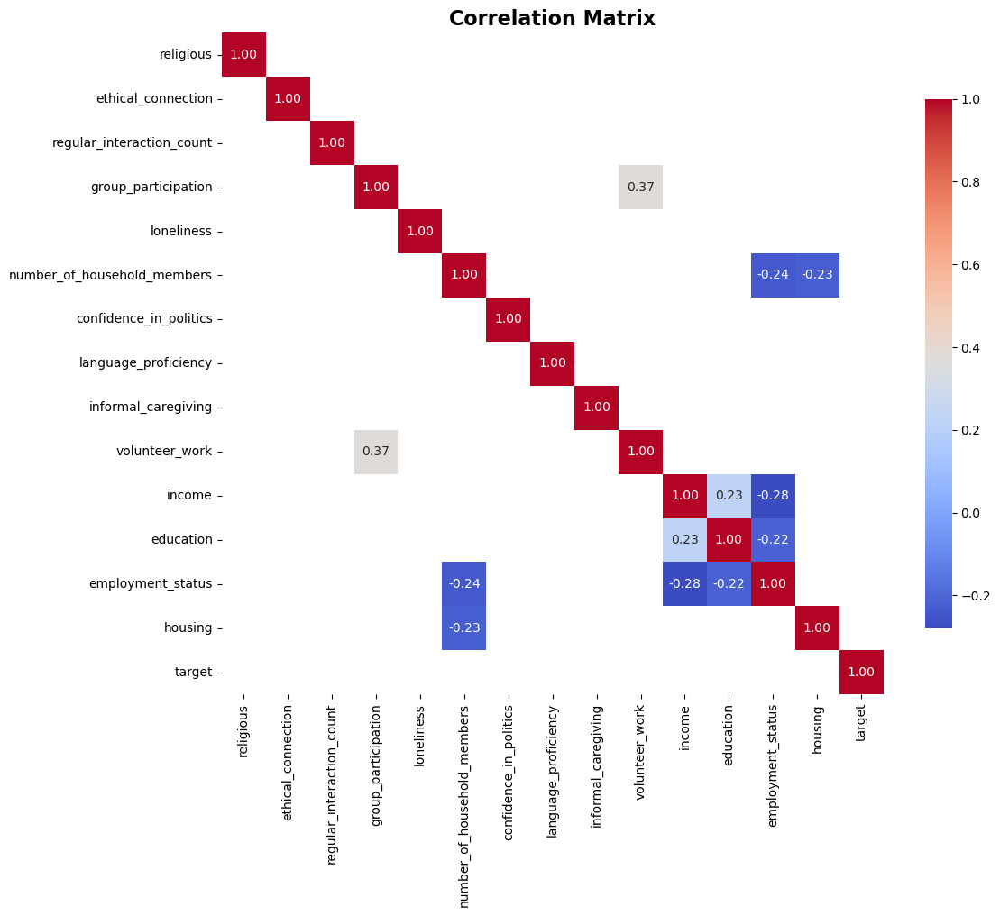

In [105]:
# check feature correlation


# correlation matrix
correlation_matrix = baseline_dataset.corr()
#creating a filtered correlation matrix for values in the upper and lower 20% of correlation values
threshold = 0.2
mask = (correlation_matrix > threshold) | (correlation_matrix < -threshold)
# Set up the matplotlib figure
plt.figure(figsize=(12, 10))
# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(correlation_matrix[mask], annot=True, cmap='coolwarm', fmt=".2f", square=True, cbar_kws={"shrink": .8})
plt.title('Correlation Matrix', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()



## Confusion matrices

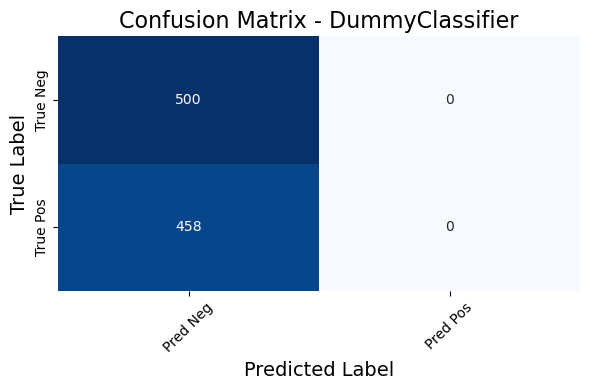

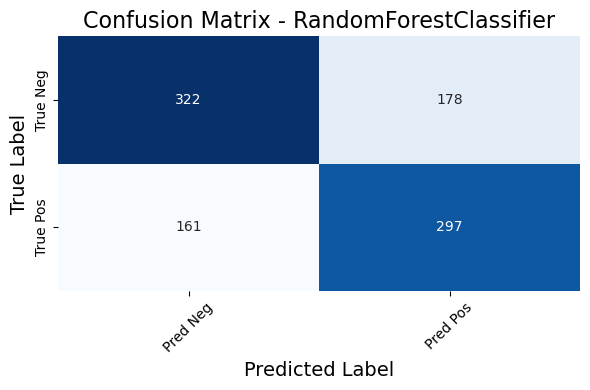

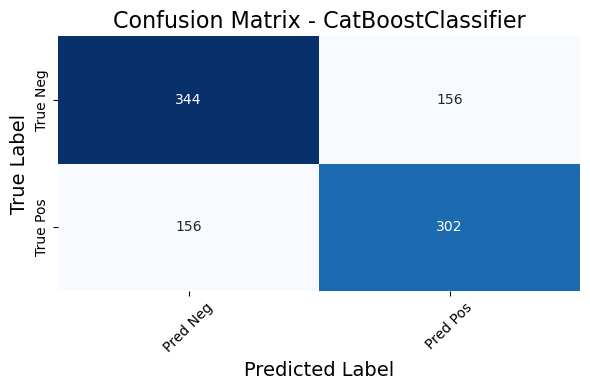

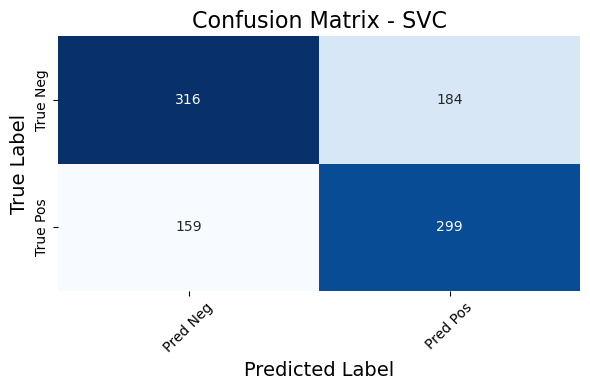

/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but AdversarialFairnessClassifier was fitted without feature names
  warnings.warn(


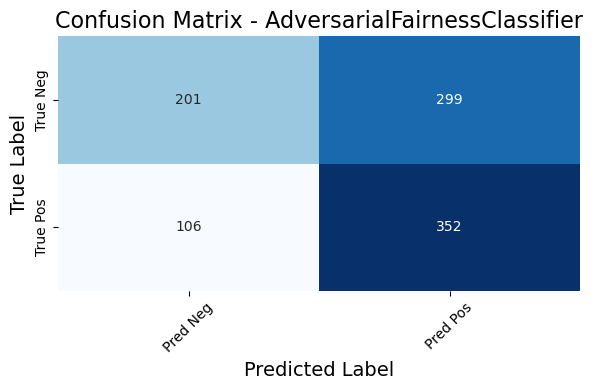

In [106]:
# Generating confusion matrices for all model predictions


def plot_confusion_matrix(y_true, y_pred, model_name):
    """
    Plots a confusion matrix for the given true and predicted labels.
    
    Parameters:
    - y_true: True labels
    - y_pred: Predicted labels
    - model_name: Name of the model for the plot title
    """
    cm = confusion_matrix(y_true, y_pred)
    cm_df = pd.DataFrame(cm, index=['True Neg', 'True Pos'], columns=['Pred Neg', 'Pred Pos'])
    
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm_df, annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.title(f'Confusion Matrix - {model_name}', fontsize=16)
    plt.xlabel('Predicted Label', fontsize=14)
    plt.ylabel('True Label', fontsize=14)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Plot confusion matrices for all models
plot_confusion_matrix(y_test, dummy_clf.predict(X_test_scaled), 'DummyClassifier')
plot_confusion_matrix(y_test, rf_clf.predict(X_test_scaled), 'RandomForestClassifier')
plot_confusion_matrix(y_test, catboost_clf.predict(X_test_scaled), 'CatBoostClassifier')
plot_confusion_matrix(y_test, svm_clf.predict(X_test_scaled), 'SVC')
plot_confusion_matrix(y_test, final_AFC_model.predict(X_test_scaled), 'AdversarialFairnessClassifier')

# 4. Model prediction on the health dataset 

## Pre-processing

In [180]:
# train test split health data
# Split the dataset into training and testing sets
X_train_health, X_test_health, y_train_health, y_test_health = train_test_split(
    health_dataset.drop(columns=['target']),
    health_dataset['target'],
    test_size=0.2,
    random_state=14
)

# to test everything works quickly, the training dataset will be reduced
# X_train_health = X_train_health.sample(frac=0.1, random_state=14)
# y_train_health = y_train_health.sample(frac=0.1, random_state=14)

In [184]:
#standardize the data
scaler = StandardScaler()
# Fit the scaler to the training data
scaler.fit(X_train_health)
# Transform the training and testing data
X_train_health_scaled = scaler.transform(X_train_health)
X_test_health_scaled = scaler.transform(X_test_health)
# Return the scaled data to a dataframe
X_train_health_scaled = pd.DataFrame(X_train_health_scaled, columns=X_train_health.columns, index=X_train_health.index)
X_test_health_scaled = pd.DataFrame(X_test_health_scaled, columns=X_test_health.columns, index=X_test_health.index)


## Preparing the CV loops

In [109]:
#defining models

# defining the models that will be used in the loops
# Dummy classifier
dummy_clf_health = DummyClassifier(strategy='most_frequent', random_state=14)

# Random Forest classifier
rf_clf_health = RandomForestClassifier(random_state=14)

# SVM classifier
svm_clf_health = SVC(random_state=14)

# CatBoost classifier
catboost_clf_health = CatBoostClassifier(random_state=14, verbose=0)

# Random Forest classifier hyperparameter grid
rf_param_grid = {
    'n_estimators': [10, 100, 500, 1000],
    'max_features': ['sqrt', 'log2'],
    'criterion': ['gini', 'entropy']
}

# CatBoost classifier hyperparameter grid
catboost_param_grid = {
    'iterations': [100, 200, 300, 1000],
    'learning_rate': [0.01, 0.05, 0.1],
    'l2_leaf_reg': [1, 3, 5, 10]
}

# SVM classifier hyperparameter grid
svm_param_grid = {
    'C': [0.001, 0.01, 0.1, 1],
    'kernel': ['linear', 'rbf', 'poly'],
    'gamma': [0.0001, 0.001, 0.01, 0.1],
}

# defining the models and their hyperparameter grids in a dictionary
models_health = {
    'RandomForestClassifier': (rf_clf_health, rf_param_grid),
    'SVC': (svm_clf_health, svm_param_grid),
    'CatBoostClassifier': (catboost_clf_health, catboost_param_grid)
}

In [110]:
# creating the loops
Inner_folds = 5
Outer_folds = 5

# Initialize the KFold object for outer cross-validation
outer_cv = KFold(n_splits=Outer_folds, shuffle=True, random_state=14)
Inner_cv = KFold(n_splits=Inner_folds, shuffle=True, random_state=14)

# Initialize a dictionary to store the results
results_health = {}

## Dummy classifier

In [111]:
# predicting with the dummy classifier
dummy_clf_health.fit(X_train_health_scaled, y_train_health)
dummy_pred_health = dummy_clf_health.predict(X_test_health_scaled)
dummy_accuracy_health = dummy_clf_health.score(X_test_health_scaled, y_test_health)

## Going through the inner loops for RF, CB, SVM on the health data

In [112]:
# RF classifier

search_RF_health = HalvingGridSearchCV(estimator=rf_clf_health, param_grid=rf_param_grid, scoring='f1', cv=Inner_cv, random_state=14, refit = True, verbose = 1, aggressive_elimination=True, factor = 5, n_jobs=-1)
nested_RF_scores_health = cross_val_score(search_RF_health, X_train_health_scaled, y_train_health, cv=outer_cv, scoring='f1')
print(f"Nested CV F1 Score for Random Forest: {nested_RF_scores_health.mean():.4f} ± {nested_RF_scores_health.std():.4f}")
search_RF_health.fit(X_train_health_scaled, y_train_health)
print(search_RF_health.best_params_)
RF_results_health = {
    'Model': 'RandomForestClassifier',
    'Accuracy': search_RF_health.score(X_test_health_scaled, y_test_health),
    'F1 Score': f1_score(y_test_health, search_RF_health.predict(X_test_health_scaled)),
    'Precision': precision_score(y_test_health, search_RF_health.predict(X_test_health_scaled)),
    'Recall': recall_score(y_test_health, search_RF_health.predict(X_test_health_scaled)),
    'ROC AUC Score': roc_auc_score(y_test_health, search_RF_health.predict(X_test_health_scaled))
}

n_iterations: 2
n_required_iterations: 2
n_possible_iterations: 2
min_resources_: 590
max_resources_: 2954
aggressive_elimination: True
factor: 5
----------
iter: 0
n_candidates: 16
n_resources: 590
Fitting 5 folds for each of 16 candidates, totalling 80 fits


/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


----------
iter: 1
n_candidates: 4
n_resources: 2950
Fitting 5 folds for each of 4 candidates, totalling 20 fits
n_iterations: 2
n_required_iterations: 2
n_possible_iterations: 2
min_resources_: 590
max_resources_: 2954
aggressive_elimination: True
factor: 5
----------
iter: 0
n_candidates: 16
n_resources: 590
Fitting 5 folds for each of 16 candidates, totalling 80 fits
----------
iter: 1
n_candidates: 4
n_resources: 2950
Fitting 5 folds for each of 4 candidates, totalling 20 fits
n_iterations: 2
n_required_iterations: 2
n_possible_iterations: 2
min_resources_: 590
max_resources_: 2954
aggressive_elimination: True
factor: 5
----------
iter: 0
n_candidates: 16
n_resources: 590
Fitting 5 folds for each of 16 candidates, totalling 80 fits
----------
iter: 1
n_candidates: 4
n_resources: 2950
Fitting 5 folds for each of 4 candidates, totalling 20 fits
n_iterations: 2
n_required_iterations: 2
n_possible_iterations: 2
min_resources_: 591
max_resources_: 2955
aggressive_elimination: True
facto

In [113]:
# CatBoost classifier
search_CatBoost_health = HalvingGridSearchCV(estimator=catboost_clf_health, param_grid=catboost_param_grid, scoring='f1', cv=Inner_cv, random_state=14, refit = True, verbose = 2, aggressive_elimination=True, factor = 5, n_jobs=-1)
nested_CatBoost_scores_health = cross_val_score(search_CatBoost_health, X_train_health_scaled, y_train_health, cv=outer_cv, scoring='f1')
print(f"Nested CV F1 Score for CatBoost: {nested_CatBoost_scores_health.mean():.4f} ± {nested_CatBoost_scores_health.std():.4f}")
search_CatBoost_health.fit(X_train_health_scaled, y_train_health, verbose=1)
print(search_CatBoost_health.best_params_)
CatBoost_results_health = {
    'Model': 'CatBoostClassifier',
    'Accuracy': search_CatBoost_health.score(X_test_health_scaled, y_test_health),
    'F1 Score': f1_score(y_test_health, search_CatBoost_health.predict(X_test_health_scaled)),
    'Precision': precision_score(y_test_health, search_CatBoost_health.predict(X_test_health_scaled)),
    'Recall': recall_score(y_test_health, search_CatBoost_health.predict(X_test_health_scaled)),
    'ROC AUC Score': roc_auc_score(y_test_health, search_CatBoost_health.predict(X_test_health_scaled))
}

n_iterations: 3
n_required_iterations: 3
n_possible_iterations: 3
min_resources_: 118
max_resources_: 2954
aggressive_elimination: True
factor: 5
----------
iter: 0
n_candidates: 48
n_resources: 118
Fitting 5 folds for each of 48 candidates, totalling 240 fits
[CV] END ..iterations=100, l2_leaf_reg=1, learning_rate=0.01; total time=   0.3s
[CV] END ..iterations=100, l2_leaf_reg=1, learning_rate=0.01; total time=   0.3s
[CV] END ..iterations=100, l2_leaf_reg=1, learning_rate=0.01; total time=   0.3s
[CV] END ..iterations=100, l2_leaf_reg=1, learning_rate=0.01; total time=   0.5s
[CV] END ..iterations=100, l2_leaf_reg=1, learning_rate=0.01; total time=   0.4s
[CV] END ..iterations=100, l2_leaf_reg=1, learning_rate=0.05; total time=   0.4s
[CV] END ..iterations=100, l2_leaf_reg=1, learning_rate=0.05; total time=   0.3s
[CV] END ..iterations=100, l2_leaf_reg=1, learning_rate=0.05; total time=   0.3s
[CV] END ..iterations=100, l2_leaf_reg=1, learning_rate=0.05; total time=   0.3s
[CV] END .

In [114]:
# SVM classifier
search_SVM_health = HalvingGridSearchCV(estimator=svm_clf_health, param_grid=svm_param_grid, scoring='f1', cv=Inner_cv, random_state=14, refit = True, verbose = 2, aggressive_elimination=False, factor = 3, n_jobs=-1)
nested_SVM_scores_health = cross_val_score(search_SVM_health, X_train_health_scaled, y_train_health, cv=outer_cv, scoring='f1')
print(f"Nested CV F1 Score for SVM: {nested_SVM_scores_health.mean():.4f} ± {nested_SVM_scores_health.std():.4f}")
search_SVM_health.fit(X_train_health_scaled, y_train_health)
print(search_SVM_health.best_params_)
SVM_results_health = {
    'Model': 'SVC',
    'Accuracy': search_SVM_health.score(X_test_health_scaled, y_test_health),
    'F1 Score': f1_score(y_test_health, search_SVM_health.predict(X_test_health_scaled)),
    'Precision': precision_score(y_test_health, search_SVM_health.predict(X_test_health_scaled)),
    'Recall': recall_score(y_test_health, search_SVM_health.predict(X_test_health_scaled)),
    'ROC AUC Score': roc_auc_score(y_test_health, search_SVM_health.predict(X_test_health_scaled))
}

n_iterations: 4
n_required_iterations: 4
n_possible_iterations: 4
min_resources_: 109
max_resources_: 2954
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 48
n_resources: 109
Fitting 5 folds for each of 48 candidates, totalling 240 fits
[CV] END ...............C=0.001, gamma=0.0001, kernel=linear; total time=   0.0s
[CV] END ...............C=0.001, gamma=0.0001, kernel=linear; total time=   0.0s
[CV] END ...............C=0.001, gamma=0.0001, kernel=linear; total time=   0.0s
[CV] END ...............C=0.001, gamma=0.0001, kernel=linear; total time=   0.0s
[CV] END ...............C=0.001, gamma=0.0001, kernel=linear; total time=   0.0s
[CV] END ..................C=0.001, gamma=0.0001, kernel=rbf; total time=   0.0s
[CV] END ..................C=0.001, gamma=0.0001, kernel=rbf; total time=   0.0s
[CV] END ..................C=0.001, gamma=0.0001, kernel=rbf; total time=   0.0s
[CV] END ..................C=0.001, gamma=0.0001, kernel=rbf; total time=   0.0s
[CV] END 

[CV] END ...................C=0.001, gamma=0.001, kernel=rbf; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ...................C=0.001, gamma=0.001, kernel=rbf; total time=   0.0s
[CV] END ...................C=0.001, gamma=0.001, kernel=rbf; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ...................C=0.001, gamma=0.001, kernel=rbf; total time=   0.1s
[CV] END ..................C=0.001, gamma=0.001, kernel=poly; total time=   0.0s
[CV] END ..................C=0.001, gamma=0.001, kernel=poly; total time=   0.1s
[CV] END .................C=0.001, gamma=0.01, kernel=linear; total time=   0.1s
[CV] END ..................C=0.001, gamma=0.001, kernel=poly; total time=   0.0s
[CV] END ....................C=0.001, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ..................C=0.001, gamma=0.001, kernel=poly; total time=   0.0s
[CV] END .................C=

In [115]:
# Training the best performing versions of all models on unseen data and final prediction
# Dummy classifier
dummy_clf_health.fit(X_train_health_scaled, y_train_health)
dummy_pred_health = dummy_clf_health.predict(X_test_health_scaled)

# # Random Forest classifier
rf_clf_health.set_params(**search_RF_health.best_params_)
rf_clf_health.fit(X_train_health_scaled, y_train_health)
rf_pred_health = rf_clf_health.predict(X_test_health_scaled)

# CatBoost classifier
catboost_clf_health.set_params(**search_CatBoost_health.best_params_)
catboost_clf_health.fit(X_train_health_scaled, y_train_health)
catboost_pred_health = catboost_clf_health.predict(X_test_health_scaled)

# SVM classifier
svm_clf_health.set_params(**search_SVM_health.best_params_)
svm_clf_health.fit(X_train_health_scaled, y_train_health)
svm_pred_health = svm_clf_health.predict(X_test_health_scaled)


## Training and validating the AFC model on health data

In [116]:
# Adversarial Fairness Classifier on health data

# --- Ensure all necessary top-level imports are loaded ---
import pandas as pd
import numpy as np
import tensorflow as tf
from math import sqrt
from functools import partial 

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score, f1_score # Add other metrics if needed by validation
from fairlearn.adversarial import AdversarialFairnessClassifier
from fairlearn.metrics import demographic_parity_difference # For validation within callback

print("Setting up advanced AFC model training block...")

# --- 1. Define Helper Functions and Callback Class ---

def advanced_optimizer_constructor(
    model, 
    initial_lr=0.001, 
    model_type_tag="predictor"
    ):
    """
    Creates a TensorFlow Adam optimizer for the given Keras model,
    with a specified initial learning rate.
    The learning rate will be dynamically updated by the callback.
    """
    optimizer = tf.keras.optimizers.Adam(learning_rate=initial_lr)
    # print(f"Optimizer created for Keras model ({model_type_tag}) with initial LR: {initial_lr:.6f}")
    return optimizer

# Global-like dictionary to hold callback state for a single training run.
# Re-initialize this before each new training run if fitting multiple times.
adv_afc_callback_state = {} 

def advanced_validate_for_afc_callback(
    afc_model_to_validate, X_val_data_np, y_val_data_series,
    sf_val_data_np, # Expecting a single sensitive feature (e.g., income) for validation DPD
    pos_label_val, 
    metric_func_val=f1_score, average_type_val='weighted'):
    """Validates the AFC model during callback."""
    predictions_on_val = afc_model_to_validate.predict(X_val_data_np)
    y_val_np_flat_val = y_val_data_series.to_numpy().ravel() if isinstance(y_val_data_series, pd.Series) else np.array(y_val_data_series).ravel()

    main_metric_val = metric_func_val(y_val_np_flat_val, predictions_on_val, average=average_type_val, zero_division=0)
    accuracy_on_val = accuracy_score(y_val_np_flat_val, predictions_on_val)
    selection_rate_on_val = np.mean(predictions_on_val == pos_label_val)
    
    dp_diff_on_val = np.nan
    if sf_val_data_np is not None and len(np.unique(sf_val_data_np)) >= 2:
        try:
            dp_diff_on_val = demographic_parity_difference(
                y_val_np_flat_val == pos_label_val,
                predictions_on_val == pos_label_val,
                sensitive_features=sf_val_data_np.ravel() 
            )
        except Exception: pass # Silently pass DPD calculation errors during callback
            
    print(
        f"  Validation - Metric ({metric_func_val.__name__}): {main_metric_val:.4f}, "
        f"Accuracy: {accuracy_on_val:.4f}, DP Diff: {dp_diff_on_val:.4f}, Sel. Rate: {selection_rate_on_val:.4f}"
    )
    return main_metric_val, dp_diff_on_val, accuracy_on_val, selection_rate_on_val

class AdvancedAFCTrainingCallback:
    def __init__(self, X_val_np, y_val_series, sf_val_np, pos_label,
                 alpha_min=0.001, alpha_max=0.5, alpha_ramp_steps=5000,
                 lr_decay_factor=0.985,
                 val_frequency_steps=100, 
                 early_stop_metric_func=f1_score, 
                 early_stop_patience_checks=5, 
                 early_stop_min_delta=0.005,
                 es_acc_thresh=0.60, es_dp_diff_thresh=0.20, 
                 es_sel_rate_min=0.05, es_sel_rate_max=0.95,
                 verbose_callback=True):
        
        self.X_val_np = X_val_np
        self.y_val_series = y_val_series
        self.sf_val_np = sf_val_np 
        self.pos_label = pos_label
        self.alpha_min = alpha_min
        self.alpha_max = alpha_max
        self.alpha_ramp_steps = alpha_ramp_steps
        self.lr_decay_factor = lr_decay_factor
        self.val_frequency_steps = val_frequency_steps
        self.early_stop_metric_func = early_stop_metric_func
        self.early_stop_patience_checks = early_stop_patience_checks
        self.early_stop_min_delta = early_stop_min_delta
        self.es_acc_thresh = es_acc_thresh
        self.es_dp_diff_thresh = es_dp_diff_thresh
        self.es_sel_rate_min = es_sel_rate_min
        self.es_sel_rate_max = es_sel_rate_max
        self.verbose_callback = verbose_callback
        self.best_val_score = -np.inf
        self.checks_without_improvement = 0

    def __call__(self, model, step, X, y, z, pos_label, sample_weight=None): 
        if self.verbose_callback and step > 0 and step % (self.val_frequency_steps // 10 or 1) == 0 :
             # print(f"  Callback invoked at step {step}.") # More frequent log if needed
             pass

        if step < self.alpha_ramp_steps:
            calculated_alpha = self.alpha_min + \
                               (self.alpha_max - self.alpha_min) * (step / self.alpha_ramp_steps)
        else:
            calculated_alpha = self.alpha_max
        model.alpha = calculated_alpha 
        
        if step > 0 and step % self.val_frequency_steps == 0:
            if self.verbose_callback:
                print(f"\nCallback at step {step}: Alpha set to {model.alpha:.4f}")

            new_lr_for_print = "N/A" 
            try:
                for optimizer_attr_name_key in ['predictor_model_', 'adversary_model_']:
                    backend_keras_model = getattr(model.backend_, optimizer_attr_name_key, None)
                    if backend_keras_model and hasattr(backend_keras_model, 'optimizer') and \
                       hasattr(backend_keras_model.optimizer, 'learning_rate'):
                        opt_cb = backend_keras_model.optimizer
                        current_lr_cb = opt_cb.learning_rate.numpy()
                        new_lr_cb = current_lr_cb * self.lr_decay_factor
                        opt_cb.learning_rate.assign(new_lr_cb)
                        new_lr_for_print = f"{new_lr_cb:.7f}" 
                if new_lr_for_print != "N/A" and self.verbose_callback: 
                     print(f"  LRs updated (decay factor: {self.lr_decay_factor}). New approx LR: {new_lr_for_print}")
            except Exception as e_lr_cb:
                if self.verbose_callback:
                    print(f"  Warning: Error updating learning rate in callback: {e_lr_cb}")

            if self.X_val_np is None or self.y_val_series is None:
                 if self.verbose_callback:
                     print("  Skipping validation in callback: Validation data not provided.")
                 return False 

            sf_val_dict_metric = {'income_for_dpd': self.sf_val_np} 
            val_score_cb, dp_diff_cb, acc_cb, sel_rate_cb = advanced_validate_for_afc_callback(
                model, self.X_val_np, self.y_val_series, 
                sf_val_dict_metric, self.pos_label, 
                metric_func_val=self.early_stop_metric_func
            )

            complex_stop = False
            if not np.isnan(dp_diff_cb) and dp_diff_cb < self.es_dp_diff_thresh and \
               acc_cb > self.es_acc_thresh and \
               sel_rate_cb > self.es_sel_rate_min and sel_rate_cb < self.es_sel_rate_max:
                if self.verbose_callback: print(f"  Complex early stopping condition met!")
                complex_stop = True

            patience_stop = False
            if val_score_cb > self.best_val_score + self.early_stop_min_delta:
                self.best_val_score = val_score_cb
                self.checks_without_improvement = 0
                if self.verbose_callback: print(f"  New best validation metric: {val_score_cb:.4f}. Resetting patience.")
            else:
                self.checks_without_improvement += 1
                if self.verbose_callback: 
                    print(f"  No improvement ({self.early_stop_metric_func.__name__}) for {self.checks_without_improvement} check(s).")

            if self.checks_without_improvement >= self.early_stop_patience_checks:
                if self.verbose_callback: print(f"  Patience-based early stopping triggered.")
                patience_stop = True
            
            if complex_stop or patience_stop: return True
                
        return False

# --- Main Script for Training the AFC Model (Health Dataset) ---

X_cv_main_features_health = X_train_health_scaled
y_cv_health = y_train_health 
sf_cv_health_for_training = X_train_health_scaled[['income']] 
main_feature_names_health = X_cv_main_features_health.columns.tolist()
X_main_holdout_test_health = X_test_health_scaled
y_holdout_test_health = y_test_health
all_sf_holdout_test_health = X_test_health_scaled['income']
all_sensitive_feature_names_for_eval_health = ['income'] 




print("\n--- Preparing Data for Final Advanced AFC Training (Health Dataset) ---")

POS_LABEL_HEALTH = 1 

# Create a validation split from X_cv_main_features_health for the callback
VAL_PROPORTION_AFC = 0.20 
use_adv_afc_callback_validation = False
X_val_for_callback_np_final, y_val_for_callback_series_final, sf_val_for_callback_np_final = None, None, None
X_train_afc_np_scaled_final, y_train_afc_final_labels, sf_train_afc_np_income_final = None, None, None
scaler_for_final_afc = MinMaxScaler() # This scaler will be fit on the sub-training data

# Check if prerequisite data is available
if 'X_cv_main_features_health' not in locals() or X_cv_main_features_health is None or \
   'y_cv_health' not in locals() or y_cv_health is None or \
   'sf_cv_health_for_training' not in locals() or sf_cv_health_for_training is None:
    print("ERROR: Essential training data (X_cv_main_features_health, y_cv_health, or sf_cv_health_for_training) is not defined. Cannot proceed.")
    final_AFC_model_health = None # Ensure model is None
else:
    if X_cv_main_features_health.shape[0] * VAL_PROPORTION_AFC >= 2 and \
       sf_cv_health_for_training.shape[0] * VAL_PROPORTION_AFC >= 2:
        
        print(f"Splitting X_cv_main_features_health for training and validation (val_proportion={VAL_PROPORTION_AFC})")
        X_train_afc_final_main, X_val_afc_df_main, \
        y_train_afc_final_labels, y_val_for_callback_series_final, \
        sf_train_afc_final_income_df, sf_val_afc_income_for_cb_df = train_test_split(
            X_cv_main_features_health, 
            y_cv_health,               
            sf_cv_health_for_training, # This is the 'income' Series/DataFrame for AFC training SF
            test_size=VAL_PROPORTION_AFC,
            random_state=14, 
            stratify=y_cv_health
        )
        use_adv_afc_callback_validation = True

        X_train_afc_np_scaled_final = scaler_for_final_afc.fit_transform(X_train_afc_final_main).astype(np.float32)
        X_train_afc_np_scaled_final = np.clip(X_train_afc_np_scaled_final, 0, 1)

        X_val_for_callback_np_final = scaler_for_final_afc.transform(X_val_afc_df_main).astype(np.float32)
        X_val_for_callback_np_final = np.clip(X_val_for_callback_np_final, 0, 1)

        sf_train_afc_np_income_final = sf_train_afc_final_income_df.astype(np.float32).to_numpy().reshape(-1, 1)
        sf_val_for_callback_np_final = sf_val_afc_income_for_cb_df.astype(np.float32).to_numpy().reshape(-1, 1)
        
        print(f"Final AFC Train shapes: X-{X_train_afc_np_scaled_final.shape}, y-{y_train_afc_final_labels.shape}, sf_income-{sf_train_afc_np_income_final.shape}")
        print(f"Callback Validation shapes: X-{X_val_for_callback_np_final.shape}, y-{y_val_for_callback_series_final.shape}, sf_income-{sf_val_for_callback_np_final.shape}")
    else:
        print("Warning: Training dataset too small or SFs not suitable for validation split. Disabling callback validation.")
        # Train on the full X_cv_main_features_health if no validation split
        X_train_afc_np_scaled_final = scaler_for_final_afc.fit_transform(X_cv_main_features_health).astype(np.float32)
        X_train_afc_np_scaled_final = np.clip(X_train_afc_np_scaled_final, 0, 1)
        y_train_afc_final_labels = y_cv_health.copy()
        sf_train_afc_np_income_final = sf_cv_health_for_training.astype(np.float32).to_numpy().reshape(-1,1)
        print(f"Training AFC on full X_cv_main_features_health (shape: {X_train_afc_np_scaled_final.shape}).")

    # --- Define AFC Model Parameters and Instantiate ---
    afc_final_predictor_structure = [64, 32] 
    afc_final_adversary_structure = [3, 'leaky_relu']    
    afc_final_total_epochs = 2000 # Max epochs if not stopped early
    afc_final_batch_size = 128
    afc_final_initial_lr = 0.001 
    afc_final_initial_alpha = 0.001

    afc_callback_instance = None
    if use_adv_afc_callback_validation:
        # Reset callback state for this training run
        adv_afc_callback_state = { 
            "best_val_score": -np.inf, 
            "stages_without_improvement": 0,
        }
        afc_callback_instance = AdvancedAFCTrainingCallback(
            X_val_np=X_val_for_callback_np_final, 
            y_val_series=y_val_for_callback_series_final, 
            sf_val_np=sf_val_for_callback_np_final, 
            pos_label=POS_LABEL_HEALTH,
            verbose_callback=True # Set to True for more printouts from callback
        )
        print("Advanced AFC callback instance created.")
    else:
        print("Callback validation disabled. AFC will run for full epochs; alpha will update but LR won't decay via callback.")

    print("\n--- Instantiating Final AdversarialFairnessClassifier ---")
    predictor_opt_constructor_partial = partial(advanced_optimizer_constructor, 
                                                initial_lr=afc_final_initial_lr, 
                                                model_type_tag="predictor_final_health")
    adversary_opt_constructor_partial = partial(advanced_optimizer_constructor, 
                                                initial_lr=afc_final_initial_lr, 
                                                model_type_tag="adversary_final_health")

    final_AFC_model_health = AdversarialFairnessClassifier(
        predictor_model=afc_final_predictor_structure,
        adversary_model=afc_final_adversary_structure,
        predictor_optimizer=predictor_opt_constructor_partial,
        adversary_optimizer=adversary_opt_constructor_partial,
        epochs=afc_final_total_epochs,
        batch_size=afc_final_batch_size,
        callbacks=afc_callback_instance, 
        backend='tensorflow',
        random_state=14, 
        alpha=afc_final_initial_alpha 
    )

    # --- Fit the Final AFC Model ---
    if X_train_afc_np_scaled_final is not None :
        print(f"\n--- Fitting Final AFC Model (max {afc_final_total_epochs} epochs) ---")
        try:
            final_AFC_model_health.fit(
                X_train_afc_np_scaled_final,
                y_train_afc_final_labels, 
                sensitive_features=sf_train_afc_np_income_final 
            )
            print("\nSuccessfully trained final AFC model with custom callbacks.")
            print(f"  Final alpha in model: {final_AFC_model_health.alpha:.4f}")
            # The 'scaler_for_final_afc' is also an important artifact if you need to reuse it.
            # It was fitted on the (sub)training data used by this AFC model.

        except Exception as e_fit_final_custom_afc:
            print(f"Final custom AFC model training FAILED: {type(e_fit_final_custom_afc).__name__} - {e_fit_final_custom_afc}")
            final_AFC_model_health = None # Ensure model is None if training failed
    else:
        # This case should ideally be caught by the initial check for X_cv_main_features_health
        print("ERROR: Training data for AFC (X_train_afc_np_scaled_final) was not prepared. Skipping fit.")
        final_AFC_model_health = None

# --- Post-Training ---
if 'final_AFC_model_health' in locals() and final_AFC_model is not None:
    print("\n--- AFC Model Training Complete ---")
    print("The trained model is available in the variable 'final_AFC_model_health'.")
    print("The scaler used for its training data is 'scaler_for_final_afc'.")
else:
    print("\n--- AFC Model Training Incomplete or Failed ---")
    print("The 'final_AFC_model_health' variable is not available or is None.")

Setting up advanced AFC model training block...

--- Preparing Data for Final Advanced AFC Training (Health Dataset) ---
Splitting X_cv_main_features_health for training and validation (val_proportion=0.2)
Final AFC Train shapes: X-(2954, 19), y-(2954,), sf_income-(2954, 1)
Callback Validation shapes: X-(739, 19), y-(739,), sf_income-(739, 1)
Advanced AFC callback instance created.

--- Instantiating Final AdversarialFairnessClassifier ---

--- Fitting Final AFC Model (max 2000 epochs) ---

Callback at step 100: Alpha set to 0.0110
  Validation - Metric (f1_score): 0.6450, Accuracy: 0.6468, DP Diff: nan, Sel. Rate: 0.5724
  New best validation metric: 0.6450. Resetting patience.

Callback at step 200: Alpha set to 0.0210
  Validation - Metric (f1_score): 0.6423, Accuracy: 0.6428, DP Diff: nan, Sel. Rate: 0.5359
  No improvement (f1_score) for 1 check(s).

Callback at step 300: Alpha set to 0.0309
  Validation - Metric (f1_score): 0.6520, Accuracy: 0.6522, DP Diff: nan, Sel. Rate: 0.526

# 5. Evaluating the results for health data

## Scoring

In [117]:
# Evaluation 

# Determine sensitive features for evaluation
# sensitive_features_list = ['religious', 'income', 'education', 'employment_status']
sensitive_features_list_health = ['income']
# Dummy classifier
dummy_eval_health = {
    'Model': 'DummyClassifier',
    'Accuracy': dummy_clf_health.score(X_test_health_scaled, y_test_health),
    'F1 Score': f1_score(y_test_health, dummy_clf_health.predict(X_test_health_scaled)),
    'Precision': precision_score(y_test_health, dummy_clf_health.predict(X_test_health_scaled)),
    'Recall': recall_score(y_test_health, dummy_clf_health.predict(X_test_health_scaled)),
    'ROC AUC Score': roc_auc_score(y_test_health, dummy_clf_health.predict(X_test_health_scaled))
}

# Random Forest classifier
rf_clf_health.fit(X_train_health_scaled, y_train_health)
RF_eval_health = {
    'Model': 'RandomForestClassifier',
    'Accuracy': rf_clf_health.score(X_test_health_scaled, y_test_health),
    'F1 Score': f1_score(y_test_health, rf_clf_health.predict(X_test_health_scaled)),
    'Precision': precision_score(y_test_health, rf_clf_health.predict(X_test_health_scaled)),
    'Recall': recall_score(y_test_health, rf_clf_health.predict(X_test_health_scaled)),
    'ROC AUC Score': roc_auc_score(y_test_health, rf_clf_health.predict(X_test_health_scaled)),
    'Demographic Parity': demographic_parity_difference(y_test_health, rf_clf_health.predict(X_test_health_scaled), sensitive_features=X_test_health_scaled[sensitive_features_list_health]),
    'Equalized Odds': equalized_odds_difference(y_test_health, rf_clf_health.predict(X_test_health_scaled), sensitive_features=X_test_health_scaled[sensitive_features_list_health])
}

# CatBoost classifier
catboost_clf_health.fit(X_train_health_scaled, y_train_health)
CatBoost_eval_health = {
    'Model': 'CatBoostClassifier',
    'Accuracy': catboost_clf_health.score(X_test_health_scaled, y_test_health),
    'F1 Score': f1_score(y_test_health, catboost_clf_health.predict(X_test_health_scaled)),
    'Precision': precision_score(y_test_health, catboost_clf_health.predict(X_test_health_scaled)),
    'Recall': recall_score(y_test_health, catboost_clf_health.predict(X_test_health_scaled)),
    'ROC AUC Score': roc_auc_score(y_test_health, catboost_clf_health.predict(X_test_health_scaled)),
    'Demographic Parity': demographic_parity_difference(y_test_health, catboost_clf_health.predict(X_test_health_scaled), sensitive_features=X_test_health_scaled[sensitive_features_list_health]),
    'Equalized Odds': equalized_odds_difference(y_test_health, catboost_clf_health.predict(X_test_health_scaled), sensitive_features=X_test_health_scaled[sensitive_features_list_health])
}

# SVM classifier
svm_clf_health.fit(X_train_health_scaled, y_train_health)
SVM_eval_health = {
    'Model': 'SVC',
    'Accuracy': svm_clf_health.score(X_test_health_scaled, y_test_health),
    'F1 Score': f1_score(y_test_health, svm_clf_health.predict(X_test_health_scaled)),
    'Precision': precision_score(y_test_health, svm_clf_health.predict(X_test_health_scaled)),
    'Recall': recall_score(y_test_health, svm_clf_health.predict(X_test_health_scaled)),
    'ROC AUC Score': roc_auc_score(y_test_health, svm_clf_health.predict(X_test_health_scaled)),
    'Demographic Parity': demographic_parity_difference(y_test_health, svm_clf_health.predict(X_test_health_scaled), sensitive_features=X_test_health_scaled[sensitive_features_list_health]),
    'Equalized Odds': equalized_odds_difference(y_test_health, svm_clf_health.predict(X_test_health_scaled), sensitive_features=X_test_health_scaled[sensitive_features_list_health])
}

# Adversarial Fairness Classifier
AFC_eval_health = {
    'Model': 'AdversarialFairnessClassifier',
    'Accuracy': final_AFC_model_health.score(X_test_health_scaled, y_test_health),
    'F1 Score': f1_score(y_test_health, final_AFC_model_health.predict(X_test_health_scaled)),
    'Precision': precision_score(y_test_health, final_AFC_model_health.predict(X_test_health_scaled)),
    'Recall': recall_score(y_test_health, final_AFC_model_health.predict(X_test_health_scaled)),
    'ROC AUC Score': roc_auc_score(y_test_health, final_AFC_model_health.predict(X_test_health_scaled)),
    'Demographic Parity': demographic_parity_difference(y_test_health, final_AFC_model_health.predict(X_test_health_scaled), sensitive_features=X_test_health_scaled[sensitive_features_list_health]),
    'Equalized Odds': equalized_odds_difference(y_test_health, final_AFC_model_health.predict(X_test_health_scaled), sensitive_features=X_test_health_scaled[sensitive_features_list_health])
}

# Storing the results in a dictionary
results_health['DummyClassifier'] = dummy_eval_health
results_health['RandomForestClassifier'] = RF_eval_health
results_health['CatBoostClassifier'] = CatBoost_eval_health
results_health['SVC'] = SVM_eval_health
results_health['AdversarialFairnessClassifier'] = AFC_eval_health
# Saving the results to a CSV file
results_df_health = pd.DataFrame(results_health)
results_df_health.to_csv('model_results_health.csv', index=True)

print(results_df_health)



/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                    DummyClassifier  RandomForestClassifier  \
Model               DummyClassifier  RandomForestClassifier   
Accuracy                   0.511905                0.704545   
F1 Score                        0.0                0.694289   
Precision                       0.0                0.701357   
Recall                          0.0                0.687361   
ROC AUC Score                   0.5                0.704146   
Demographic Parity              NaN                0.527778   
Equalized Odds                  NaN                0.571429   

                    CatBoostClassifier       SVC  \
Model               CatBoostClassifier       SVC   
Accuracy                      0.713203  0.666667   
F1 Score                      0.703247  0.678497   
Precision                     0.710407  0.641026   
Recall                        0.696231  0.720621   
ROC AUC Score                 0.712809  0.667921   
Demographic Parity                0.75   0.66129   
Equalized Odds  

/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but AdversarialFairnessClassifier was fitted without feature names
  warnings.warn(
/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but AdversarialFairnessClassifier was fitted without feature names
  warnings.warn(
/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but AdversarialFairnessClassifier was fitted without feature names
  warnings.warn(
/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but AdversarialFairnessClassifier was fitted without feature names
  warnings.warn(
/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but AdversarialFairnessClassifier was fitted without feature names
  warnings.warn(


## Feature importance

/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(



Calculating permutation importance for RandomForestClassifier Health...


/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with f

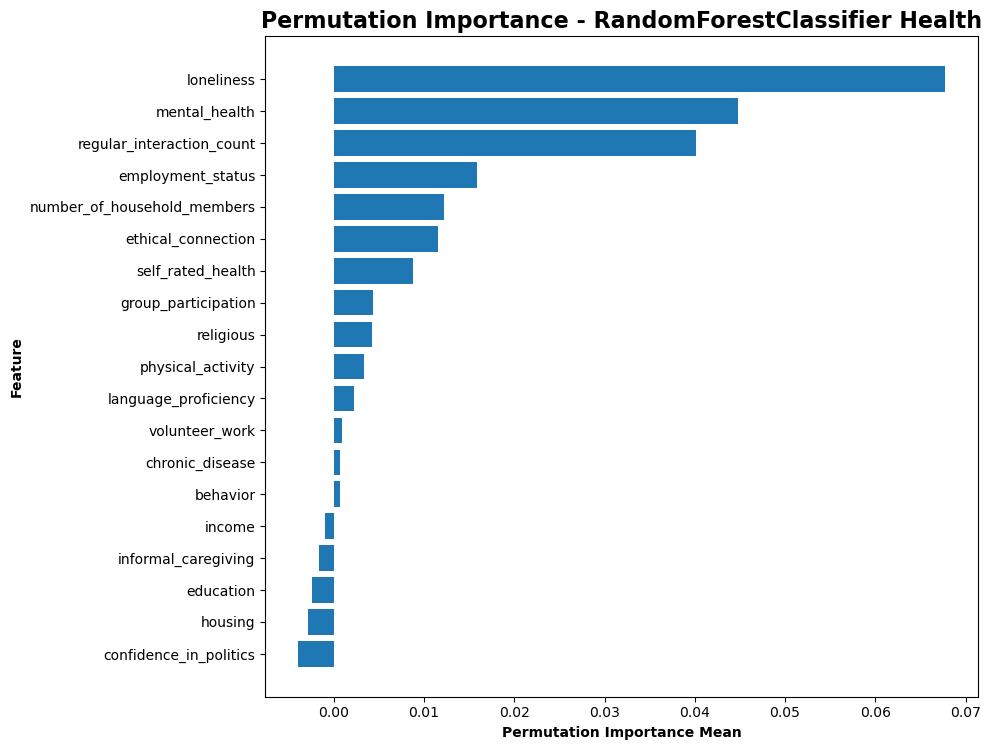


Calculating permutation importance for CatBoostClassifier Health...


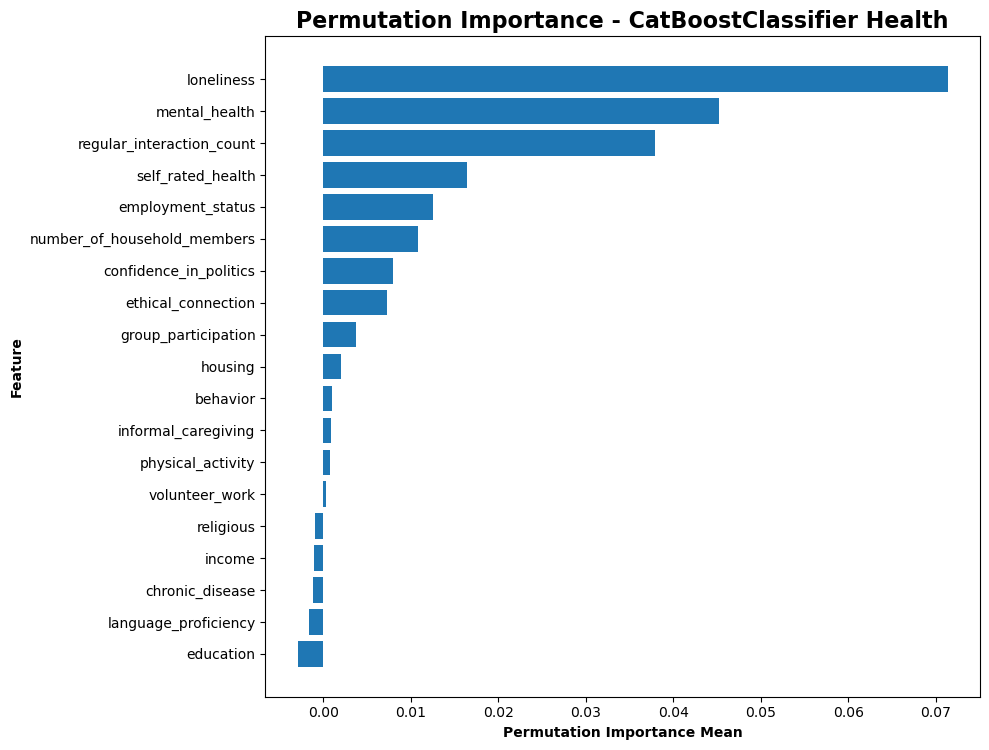


Calculating permutation importance for SVC Health...


/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/skle

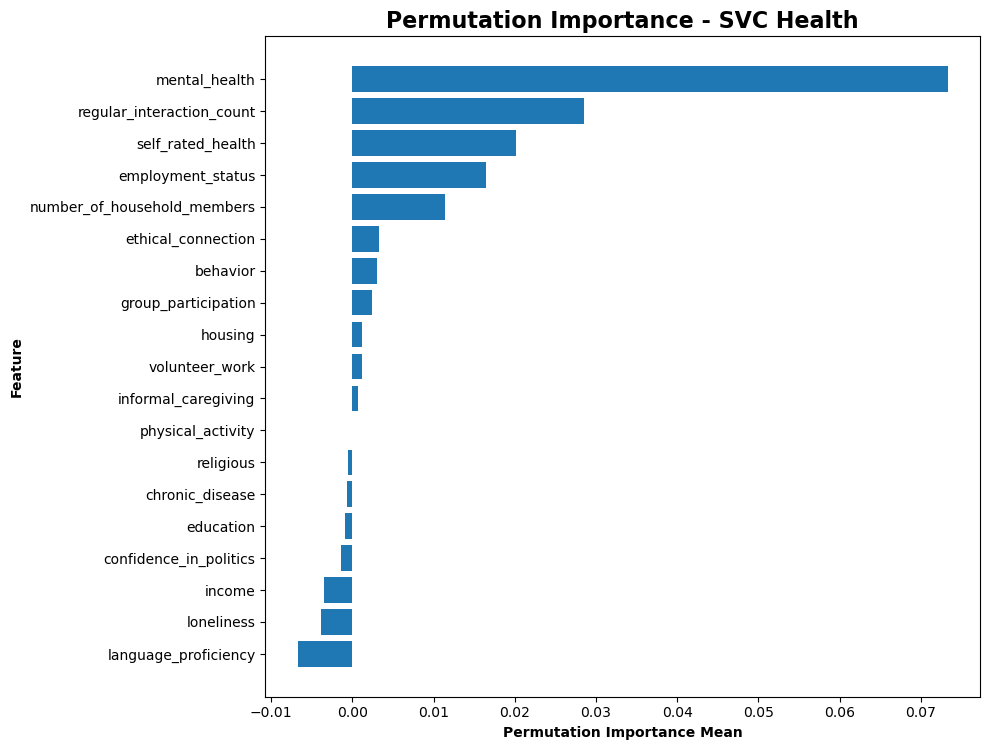


Calculating permutation importance for AdversarialFairnessClassifier Health...


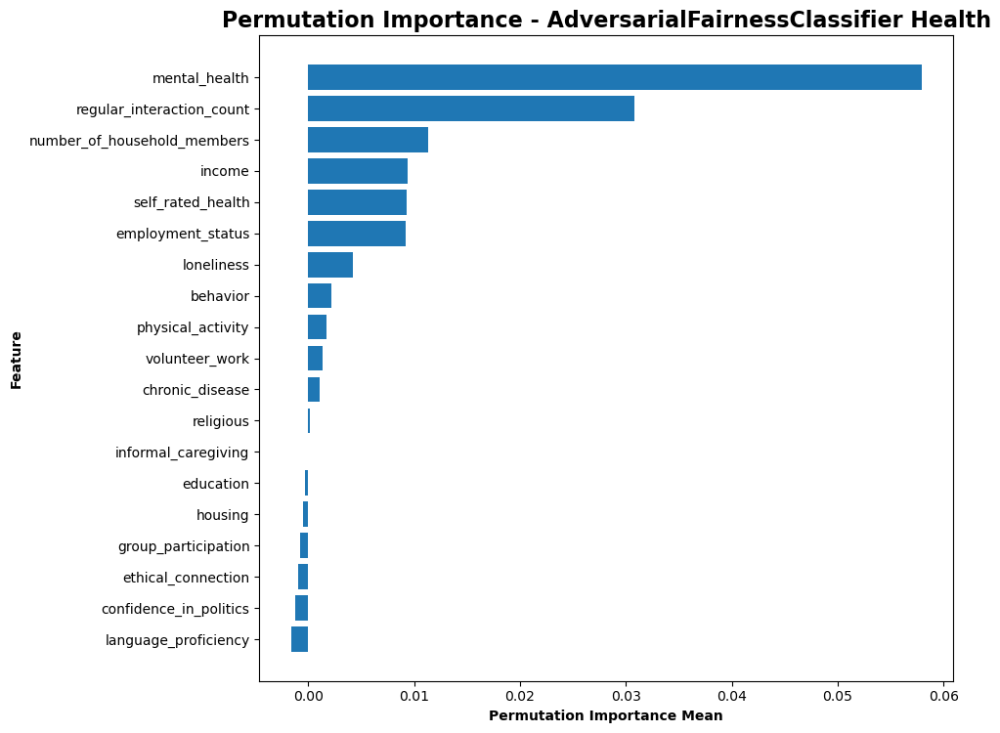

In [118]:
# Feature importance
# Permutation importance of features per model


# plot permutation importance for each model
plot_permutation_importance(rf_clf_health, X_test_health_scaled, y_test_health, X_test_health_scaled.columns, 'RandomForestClassifier Health')
plot_permutation_importance(catboost_clf_health, X_test_health_scaled, y_test_health, X_test_health_scaled.columns, 'CatBoostClassifier Health')
plot_permutation_importance(svm_clf_health, X_test_health_scaled, y_test_health, X_test_health_scaled.columns, 'SVC Health')
plot_permutation_importance(final_AFC_model_health, X_test_health_scaled, y_test_health, X_test_health_scaled.columns, 'AdversarialFairnessClassifier Health')


## Feature correlation

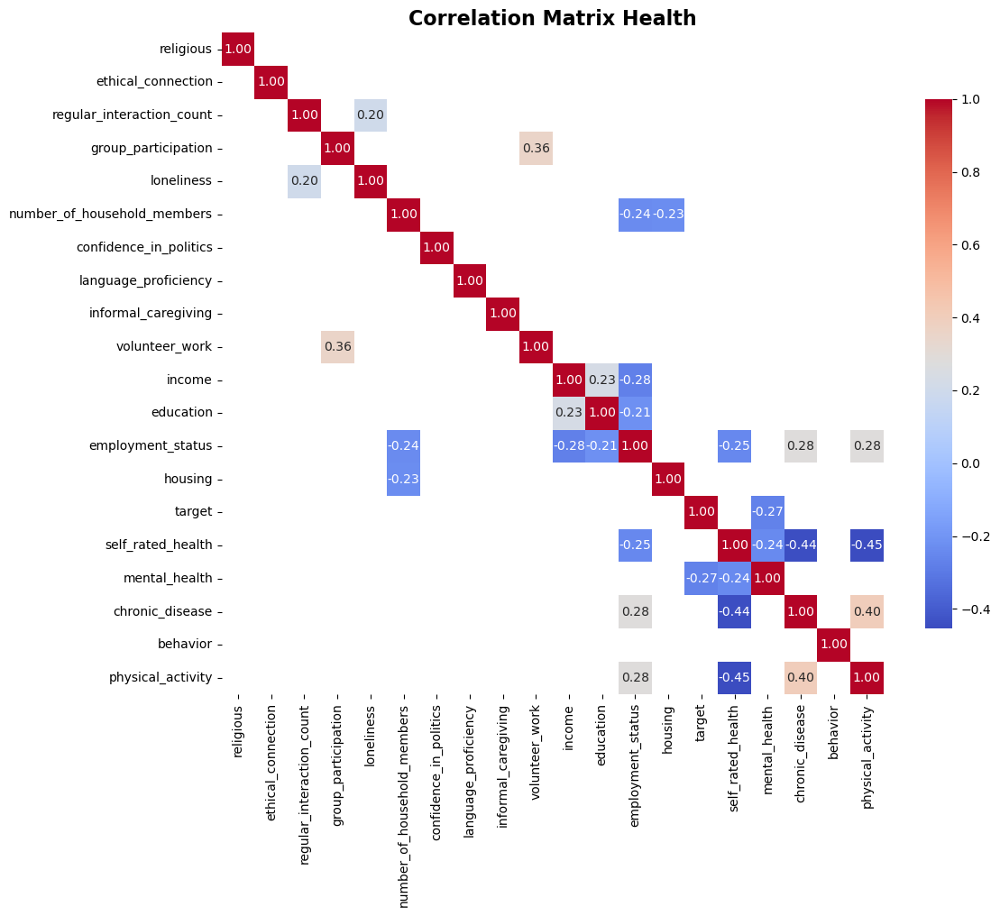

In [119]:
# check feature correlation


# correlation matrix
correlation_matrix_health = health_dataset.corr()
#creating a filtered correlation matrix for values in the upper and lower 20% of correlation values
threshold = 0.2
mask = (correlation_matrix_health > threshold) | (correlation_matrix_health < -threshold)
# Set up the matplotlib figure
plt.figure(figsize=(12, 10))
# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(correlation_matrix_health[mask], annot=True, cmap='coolwarm', fmt=".2f", square=True, cbar_kws={"shrink": .8})
plt.title('Correlation Matrix Health', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()


## Confusion matrices

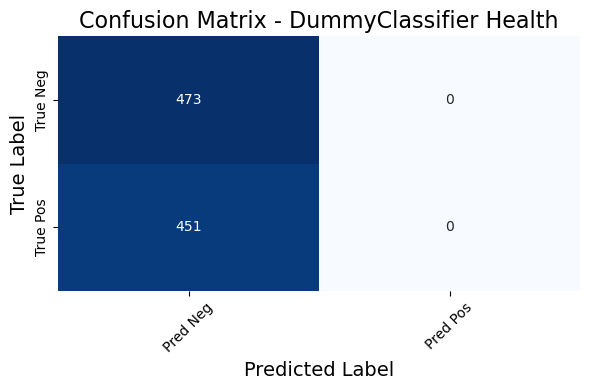

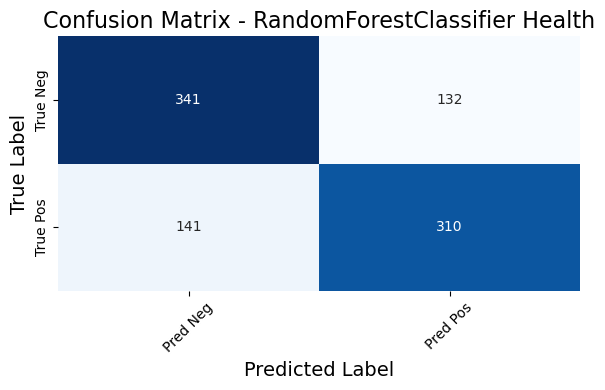

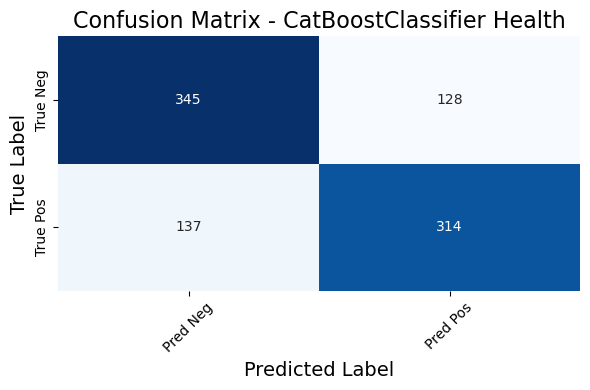

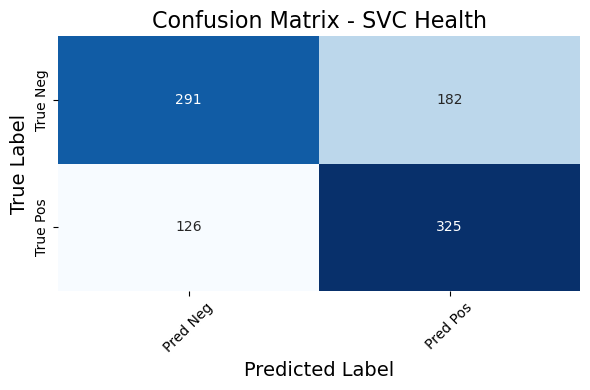

/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but AdversarialFairnessClassifier was fitted without feature names
  warnings.warn(


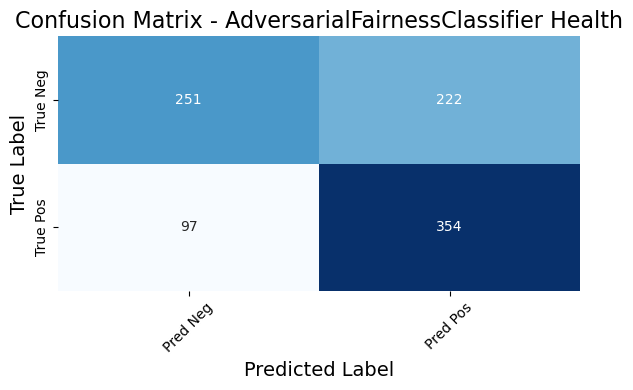

In [120]:
# Generating confusion matrices for all model predictions


# plot confusion matrices for all models
plot_confusion_matrix(y_test_health, dummy_clf_health.predict(X_test_health_scaled), 'DummyClassifier Health')
plot_confusion_matrix(y_test_health, rf_clf_health.predict(X_test_health_scaled), 'RandomForestClassifier Health')
plot_confusion_matrix(y_test_health, catboost_clf_health.predict(X_test_health_scaled), 'CatBoostClassifier Health')
plot_confusion_matrix(y_test_health, svm_clf_health.predict(X_test_health_scaled), 'SVC Health')
plot_confusion_matrix(y_test_health, final_AFC_model_health.predict(X_test_health_scaled), 'AdversarialFairnessClassifier Health')


## Storing models

### Final fit capture

In [121]:
# dataframe with the final fit for all models
# baseline dataset

hyperparameters_baseline = {
    'RandomForestClassifier': search_RF.best_params_,
    'CatBoostClassifier': search_CatBoost.best_params_,
    'SVC': search_SVM.best_params_,
    'AFC': final_AFC_model.get_params()
}

hyperparameters_health = {
    'RandomForestClassifier': search_RF_health.best_params_,
    'CatBoostClassifier': search_CatBoost_health.best_params_,
    'SVC': search_SVM_health.best_params_,
    'AFC': final_AFC_model_health.get_params()
}
print(hyperparameters_baseline)
# Create a DataFrame to store the hyperparameters
hyperparameters_df = pd.DataFrame()
# Combine the hyperparameters for baseline and health datasets into a single DataFrame
# Combine the hyperparameters for baseline and health datasets into a single DataFrame
hyperparameters_df = pd.DataFrame({
    'Dataset': ['Baseline', 'Health'],
    'RandomForestClassifier': [hyperparameters_baseline['RandomForestClassifier'], hyperparameters_health['RandomForestClassifier']],
    'CatBoostClassifier': [hyperparameters_baseline['CatBoostClassifier'], hyperparameters_health['CatBoostClassifier']],
    'SVC': [hyperparameters_baseline['SVC'], hyperparameters_health['SVC']],
    'AFC': [hyperparameters_baseline['AFC'], hyperparameters_health['AFC']]
})
# Display the DataFrame
print(hyperparameters_df)

#export the dataframe to a csv file
hyperparameters_df.to_csv('hyperparameters.csv', index=True)

{'RandomForestClassifier': {'criterion': 'gini', 'max_features': 'sqrt', 'n_estimators': 500}, 'CatBoostClassifier': {'iterations': 100, 'l2_leaf_reg': 10, 'learning_rate': 0.05}, 'SVC': {'C': 1, 'gamma': 0.01, 'kernel': 'rbf'}, 'AFC': {'adversary_model': [3, 'leaky_relu'], 'adversary_optimizer': functools.partial(<function advanced_optimizer_constructor at 0x140105440>, initial_lr=0.001, model_type_tag='adversary_final_health'), 'alpha': 0.07086, 'backend': 'tensorflow', 'batch_size': 128, 'callbacks': <__main__.AdvancedAFCTrainingCallback object at 0x151abbfd0>, 'constraints': 'demographic_parity', 'cuda': None, 'epochs': 2000, 'learning_rate': 0.001, 'predictor_model': [64, 32], 'predictor_optimizer': functools.partial(<function advanced_optimizer_constructor at 0x140105440>, initial_lr=0.001, model_type_tag='predictor_final_health'), 'progress_updates': None, 'random_state': 14, 'shuffle': False, 'skip_validation': False, 'warm_start': False}}
    Dataset                           

### Saving the models

In [122]:
# exporting the trained model for easy use later
# No need to run the full training cycle every time
import joblib

#Health
# Save RF model (Health)
joblib.dump(rf_clf_health, 'rf_model_health.joblib')

# Save SVC model (Health)
joblib.dump(svm_clf_health, 'svc_model_health.joblib')
print("RF and SVC models for health data saved.")

# Save CatBoost model (Health)
catboost_clf_health.save_model('catboost_model_health.cbm')
print("CatBoost model for health data saved.")


#Baseline
# Save RF model (Baseline)
joblib.dump(rf_clf, 'rf_model_baseline.joblib')
print("RF model for baseline data saved.")

# Save SVC model (Baseline)
joblib.dump(svm_clf, 'svc_model_baseline.joblib')
print("SVC model for baseline data saved.")

# Save CatBoost model (Baseline)
catboost_clf.save_model('catboost_model_baseline.cbm')
print("CatBoost model for baseline data saved.")



RF and SVC models for health data saved.
CatBoost model for health data saved.
RF model for baseline data saved.
SVC model for baseline data saved.
CatBoost model for baseline data saved.


# 6. Analysis of results

## Class-based performance per model
checking happier than average/less happy than average per model per dataset
see if the models do better for the positive or negative class
F1 score, recall, precision 
apparently three axes that are relevant: class (yes/no), model, dataset. and then four different results. table or plot? tbd
perhaps label models for dataset: so rf_b, rf_h for diminishing axes, but still four evaluation measures are included 

In [156]:
# Calculating the metrics

class_performance_results = []

# --- Main Analysis Loop ---
for config in models_config:
    model_name_full = config["name"] # e.g., RF_Baseline
    model = config["model"]
    X_test_df = config["X_test"]
    y_true = config["y_test"]
    dataset_type = config["dataset_type"]

    print(f"Processing class-based performance for: {model_name_full} on {dataset_type} dataset...")

    # Get predictions
    try:
        y_pred = model.predict(X_test_df)
    except Exception as e:
        print(f"Error predicting with {model_name_full} using DataFrame: {e}. Trying with .values for X_test_df.")
        try:
            y_pred = model.predict(X_test_df.values)
        except Exception as e_np:
            print(f"Error predicting with {model_name_full} using .values: {e_np}. Skipping this model.")
            continue
    
    # Ensure y_true and y_pred are 1D arrays/series for classification_report
    y_true_np = y_true.squeeze().to_numpy() if isinstance(y_true, (pd.Series, pd.DataFrame)) else np.array(y_true).squeeze()
    y_pred_np = y_pred.squeeze() if isinstance(y_pred, (pd.Series, pd.DataFrame)) else np.array(y_pred).squeeze()

    if y_true_np.ndim > 1 or y_pred_np.ndim > 1:
        print(f"Warning: y_true or y_pred for {model_name_full} are not 1D after squeeze. Skipping.")
        continue

    # Generate classification report as a dictionary
    # Use zero_division=0 to handle cases where a class has no predicted samples (avoiding warnings)
    report = classification_report(y_true_np, y_pred_np, output_dict=True, zero_division=0)

    for class_label in ['0', '1']: 
        if class_label in report:
            class_metrics = report[class_label]
            class_performance_results.append({
                'model_dataset': model_name_full, # Combined name like RF_Baseline
                'model': model_name_full.split('_')[0], # e.g., RF
                'dataset': dataset_type, # e.g., Baseline
                'class': int(class_label), # 0 for 'less happy', 1 for 'happier'
                'precision': class_metrics['precision'],
                'recall': class_metrics['recall'],
                'f1-score': class_metrics['f1-score'],
                'support': class_metrics['support'] # Number of true instances for this class
            })
        else:
            # Handle cases where a class might not be present in predictions or true labels (less common)
            print(f"Warning: Class {class_label} not found in classification report for {model_name_full}.")
            class_performance_results.append({
                'model_dataset': model_name_full,
                'model': model_name_full.split('_')[0],
                'dataset': dataset_type,
                'class': int(class_label),
                'precision': np.nan,
                'recall': np.nan,
                'f1-score': np.nan,
                'support': 0
            })


# Convert results to a DataFrame
class_performance_df = pd.DataFrame(class_performance_results)

print("\n--- Class-Based Performance Metrics ---")
if not class_performance_df.empty:
    # Displaying the table. You can sort or pivot it as needed for better analysis.
    # Example: Sort by model, then class
    print(class_performance_df.sort_values(by=['model_dataset', 'class']).to_string())
    
    # Example: Pivot table for a specific metric, e.g., F1-score
    # try:
    #     f1_pivot = class_performance_df.pivot_table(
    #         index='model_dataset', 
    #         columns='class', 
    #         values='f1-score'
    #     )
    #     print("\n--- F1-Score Pivot Table (Class 0 vs Class 1) ---")
    #     print(f1_pivot)
    # except Exception as e:
    #     print(f"Could not create F1 pivot table: {e}")

else:
    print("No class-based performance data generated.")

# Saving the df to csv


Processing class-based performance for: RF_Baseline on Baseline dataset...
Processing class-based performance for: CB_Baseline on Baseline dataset...
Processing class-based performance for: SVM_Baseline on Baseline dataset...
Processing class-based performance for: AFC_Baseline on Baseline dataset...


/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but AdversarialFairnessClassifier was fitted without feature names
  warnings.warn(


Processing class-based performance for: RF_Health on Health dataset...
Processing class-based performance for: CB_Health on Health dataset...
Processing class-based performance for: SVM_Health on Health dataset...
Processing class-based performance for: AFC_Health on Health dataset...

--- Class-Based Performance Metrics ---
   model_dataset model   dataset  class  precision    recall  f1-score  support
6   AFC_Baseline   AFC  Baseline      0   0.654723  0.402000  0.498141    500.0
7   AFC_Baseline   AFC  Baseline      1   0.540707  0.768559  0.634806    458.0
14    AFC_Health   AFC    Health      0   0.721264  0.530655  0.611449    473.0
15    AFC_Health   AFC    Health      1   0.614583  0.784922  0.689387    451.0
2    CB_Baseline    CB  Baseline      0   0.688000  0.688000  0.688000    500.0
3    CB_Baseline    CB  Baseline      1   0.659389  0.659389  0.659389    458.0
10     CB_Health    CB    Health      0   0.715768  0.729387  0.722513    473.0
11     CB_Health    CB    Health 

/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but AdversarialFairnessClassifier was fitted without feature names
  warnings.warn(


## Checking what features have values that differ from the mean on average
this shows a difference in importance of values for prediction
check the importance of features for all models for all datasets for all CM parts (FP,TN,TP,FN)
showing the features that contribute the most to the CM values and how they are different than the mean nuances both the feature importance measure and the CM measure
the results hopefully show that different features impact different measures differently
e.g. CB predicts FP's on different values than the mean where other models do not (True, false, false, false) and these values are higher than average
showing that CB has a tendency to predict FP's for higher incomes where other models do not
but for TN's this feature is not important anymore
the results could be shown per score (fp,tn,tp,fn) and per model (rf_b, rf_h, etc) giving a table of what features are important and how they differ (eg. TN cb_b, loneliness +7,5%)

compared to the feature importance to determine the final impact of this finding on prediction. 
e.g. a feature that is different from the other models that only has an importance of 0.001 is not that significant

so we look for features that both show large discrepancies from mean values as well as have large importance in prediction
showing the socio-economic factors that are most important per prediction
showing that per model the relative importance of SES components is different
meaning that we can interpret if models deviate from the mean when compared to other models, e.g. placing more importance on people that own a house, or people that have low education. 
This add nuance, showing that e.g. high education can cause FN's in a RF model, while a CB model has power for predicting TP's in low education.
so you can select models based on what is important to find: do you care more about finding happiness ALL lonely people for example, or do you care about predicting who is unhappy based on voluntary work, and is catching TN not as important as preventing FN's? it allows for more specificity in questioning, for example when determining where funding should go

In [143]:
# filtering features per CM component for sd > 0.5 away from mean

models_config = [
    # Baseline Models
    {"name": "RF_Baseline", "model": rf_clf, "X_test": X_test_scaled, "y_test": y_test, "dataset_type": "Baseline"},
    {"name": "CB_Baseline", "model": catboost_clf, "X_test": X_test_scaled, "y_test": y_test, "dataset_type": "Baseline"},
    {"name": "SVM_Baseline", "model": svm_clf, "X_test": X_test_scaled, "y_test": y_test, "dataset_type": "Baseline"},
    {"name": "AFC_Baseline", "model": final_AFC_model, "X_test": X_test_scaled, "y_test": y_test, "dataset_type": "Baseline"},
    # Health Models
    {"name": "RF_Health", "model": rf_clf_health, "X_test": X_test_health_scaled, "y_test": y_test_health, "dataset_type": "Health"},
    {"name": "CB_Health", "model": catboost_clf_health, "X_test": X_test_health_scaled, "y_test": y_test_health, "dataset_type": "Health"},
    {"name": "SVM_Health", "model": svm_clf_health, "X_test": X_test_health_scaled, "y_test": y_test_health, "dataset_type": "Health"},
    {"name": "AFC_Health", "model": final_AFC_model_health, "X_test": X_test_health_scaled, "y_test": y_test_health, "dataset_type": "Health"},
]

results_list = []
significance_threshold = 0.5

# --- Main Analysis Loop ---
for config in models_config:
    model_name = config["name"]
    model = config["model"]
    X_test_df = config["X_test"]
    y_true = config["y_test"]
    dataset_type = config["dataset_type"]

    print(f"Processing: {model_name} on {dataset_type} dataset...")

    # Ensure X_test_df is a DataFrame (it should be)
    if not isinstance(X_test_df, pd.DataFrame):
        print(f"Warning: X_test for {model_name} is not a DataFrame. Skipping feature name analysis for this model.")
        continue # Skip this model configuration if X_test is not a DataFrame


    # Get predictions
    try:
        y_pred = model.predict(X_test_df)
    except Exception as e:
        print(f"Error predicting with {model_name} using DataFrame: {e}. Trying with .values for X_test_df.")
        # Some models, especially if not sklearn-native wrappers, might prefer numpy
        try:
            y_pred = model.predict(X_test_df.values)
        except Exception as e_np:
            print(f"Error predicting with {model_name} using .values: {e_np}. Skipping this model.")
            continue


    # Calculate overall mean for each feature in the current test set
    # For scaled data (mean~0, std~1), overall_mean_series will be close to 0 for each feature.
    overall_mean_series = X_test_df.mean()

    # Identify indices for TP, TN, FP, FN
    # Ensure y_true and y_pred are 1D arrays/series
    y_true_np = y_true.squeeze().to_numpy() if isinstance(y_true, (pd.Series, pd.DataFrame)) else np.array(y_true).squeeze()
    y_pred_np = y_pred.squeeze() if isinstance(y_pred, (pd.Series, pd.DataFrame)) else np.array(y_pred).squeeze()


    # Check for issues if y_true_np or y_pred_np are not simple 1D arrays
    if y_true_np.ndim > 1 or y_pred_np.ndim > 1:
        print(f"Warning: y_true or y_pred for {model_name} are not 1D. Squeezing. Original shapes: y_true: {y_true.shape if hasattr(y_true, 'shape') else 'N/A'}, y_pred: {y_pred.shape if hasattr(y_pred, 'shape') else 'N/A'}")

    # Define conditions for TP, TN, FP, FN
    tp_indices = (y_true_np == 1) & (y_pred_np == 1)
    tn_indices = (y_true_np == 0) & (y_pred_np == 0)
    fp_indices = (y_true_np == 0) & (y_pred_np == 1)
    fn_indices = (y_true_np == 1) & (y_pred_np == 0)

    cm_segments = {
        "TP": tp_indices,
        "TN": tn_indices,
        "FP": fp_indices,
        "FN": fn_indices,
    }

    for segment_name, segment_indices in cm_segments.items():
        # Filter the DataFrame for the current segment
        # segment_indices should be a boolean Series/array of the same length as X_test_df
        if segment_indices.sum() > 0: # Check if the segment is not empty
            segment_df = X_test_df[segment_indices]
            segment_mean_series = segment_df.mean()
            # This difference_series represents (segment_mean - overall_mean) for each feature
            difference_series = segment_mean_series - overall_mean_series

            for feature_name in X_test_df.columns:
                current_segment_mean = segment_mean_series.get(feature_name, np.nan)
                current_overall_mean = overall_mean_series.get(feature_name, np.nan)
                current_difference = difference_series.get(feature_name, np.nan)

                # Filter for significance:
                # Only add if the absolute difference is > SIGNIFICANCE_THRESHOLD
                # and the difference value is not NaN.
                if pd.notna(current_difference) and abs(current_difference) > significance_threshold:
                    results_list.append({
                        "model_name": model_name,
                        "dataset_type": dataset_type,
                        "cm_part": segment_name,
                        "feature": feature_name,
                        "segment_mean": current_segment_mean,
                        "overall_mean": current_overall_mean,
                        "difference_from_overall_mean": current_difference
                    })
        else:
            # If segment is empty, just print a message.
            # No features from this segment will be added to the results_list as they don't meet significance.
            print(f"Segment {segment_name} is empty for {model_name} on {dataset_type} dataset. No features added for this segment.")


# Convert results to a DataFrame
feature_cm_analysis_df = pd.DataFrame(results_list)

# Saving the results to csv
feature_cm_analysis_df.to_csv('feature_cm_analysis_results.csv', index=False)

Processing: RF_Baseline on Baseline dataset...
Processing: CB_Baseline on Baseline dataset...
Processing: SVM_Baseline on Baseline dataset...
Processing: AFC_Baseline on Baseline dataset...
Processing: RF_Health on Health dataset...


/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but AdversarialFairnessClassifier was fitted without feature names
  warnings.warn(


Processing: CB_Health on Health dataset...
Processing: SVM_Health on Health dataset...
Processing: AFC_Health on Health dataset...


/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but AdversarialFairnessClassifier was fitted without feature names
  warnings.warn(



--- Heatmap Visualization of Feature Deviations (Actual Values) ---


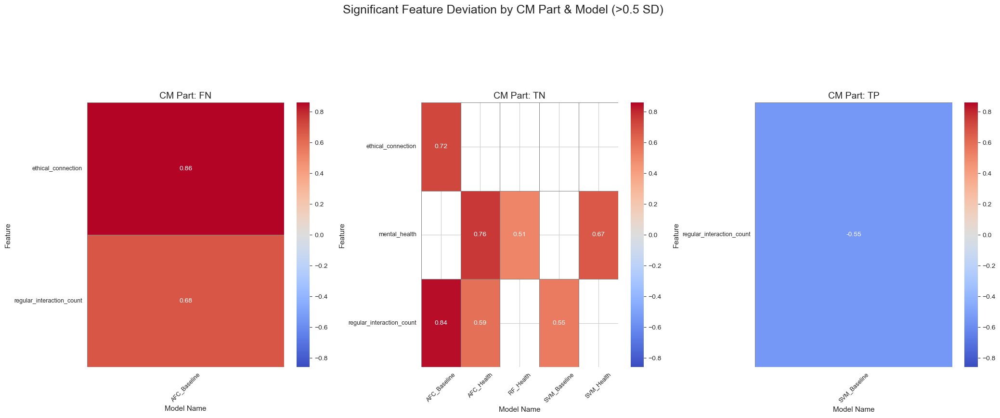

In [196]:
# Visualizing the results

sns.set_style("whitegrid")

if feature_cm_analysis_df.empty:
    print("No data to plot (DataFrame is empty, possibly due to significance threshold from previous step).")
else:
    # --- Heatmap Visualization with Actual Values ---
    print("\n--- Heatmap Visualization of Feature Deviations (Actual Values) ---")
    
    cm_parts = sorted(feature_cm_analysis_df['cm_part'].unique())
    n_cm_parts = len(cm_parts)

    if n_cm_parts == 0:
        print("No cm_parts found in the data to plot.")
    else:
        # Arrange all subplots in a single row
        n_rows = 1
        n_cols = n_cm_parts

        fig_width = n_cols * 7  # Adjusted width per subplot
        fig_height = 8  # Adjusted height for better annotation readability
        if n_cols == 1: 
            fig_width = 9


        fig, axes = plt.subplots(n_rows, n_cols, figsize=(fig_width, fig_height), squeeze=False)
        
        # Find global min and max for consistent color scaling across heatmaps
        # This ensures the color scale is the same for all subplots if desired
        # If the dataframe is empty after filtering, these will raise an error.
        if not feature_cm_analysis_df['difference_from_overall_mean'].empty:
            global_min = feature_cm_analysis_df['difference_from_overall_mean'].min()
            global_max = feature_cm_analysis_df['difference_from_overall_mean'].max()
            abs_max_val = max(abs(global_min), abs(global_max), 0.01) # Ensure not zero for vmin/vmax
        else: # Fallback if df is empty after some filtering step (should not happen if outer check works)
            abs_max_val = 1 


        for i, part in enumerate(cm_parts):
            ax = axes[0, i] 
            df_part = feature_cm_analysis_df[feature_cm_analysis_df['cm_part'] == part]

            if df_part.empty:
                ax.set_title(f'CM Part: {part}\n(No significant features)', fontsize=12)
                ax.axis('off')
                continue

            pivot_values_df = df_part.pivot_table(
                index='feature',
                columns='model_name',
                values='difference_from_overall_mean',
                fill_value=np.nan # Keep NaN for missing combinations to show them as blank in heatmap
            )
            
            if pivot_values_df.empty:
                ax.set_title(f'CM Part: {part}\n(Pivot resulted in empty table)', fontsize=12)
                ax.axis('off')
                continue

            sns.heatmap(
                pivot_values_df, # Use the actual values for the heatmap data
                annot=True,      # Annotate with the values
                fmt=".2f",       # Format annotations to 2 decimal places
                cmap="coolwarm", # Continuous diverging colormap
                linewidths=.5,
                linecolor='gray',   
                cbar=True,       # Show the color bar
                ax=ax,
                center=0,        # Center the colormap at 0 for diverging data
                vmin=-abs_max_val, # Symmetrical color scale based on global data range
                vmax=abs_max_val
            )
            ax.set_title(f'CM Part: {part}', fontsize=14)
            ax.set_xlabel('Model Name', fontsize=11)
            ax.set_ylabel('Feature', fontsize=11)
            ax.tick_params(axis='x', labelrotation=45, labelsize=9) 
            ax.tick_params(axis='y', labelrotation=0, labelsize=9)

        fig.suptitle('Significant Feature Deviation by CM Part & Model (>0.5 SD)', fontsize=18, y=1.03 if n_rows > 1 else 1.08) 
        plt.tight_layout(rect=[0, 0, 1, 0.95 if n_rows > 1 else 0.92]) 
        plt.show()



## determining the impact of fairness classification on predictions per group in income, per model, per dataset



--- Calculating True Class Distributions for Test Sets ---
Calculating distribution for: Baseline Test Set


Calculating distribution for: Health Test Set

True Class Distribution Summary (Test Sets):


/var/folders/hk/gkxw9p6d3wb6_vcyr1zh90780000gn/T/ipykernel_14321/3800169042.py:107: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  true_dist_pivot_for_lookup = true_distribution_summary_df.pivot_table(
/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but AdversarialFairnessClassifier was fitted without feature names
  warnings.warn(
/Users/kevinduquesnoy/anaconda3/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but AdversarialFairnessClassifier was fitted without feature names
  warnings.warn(



--- Generating Heatmap for Positive Prediction Rate ---


/var/folders/hk/gkxw9p6d3wb6_vcyr1zh90780000gn/T/ipykernel_14321/3800169042.py:217: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  ppr_pivot_df = cm_by_group_df.pivot_table(


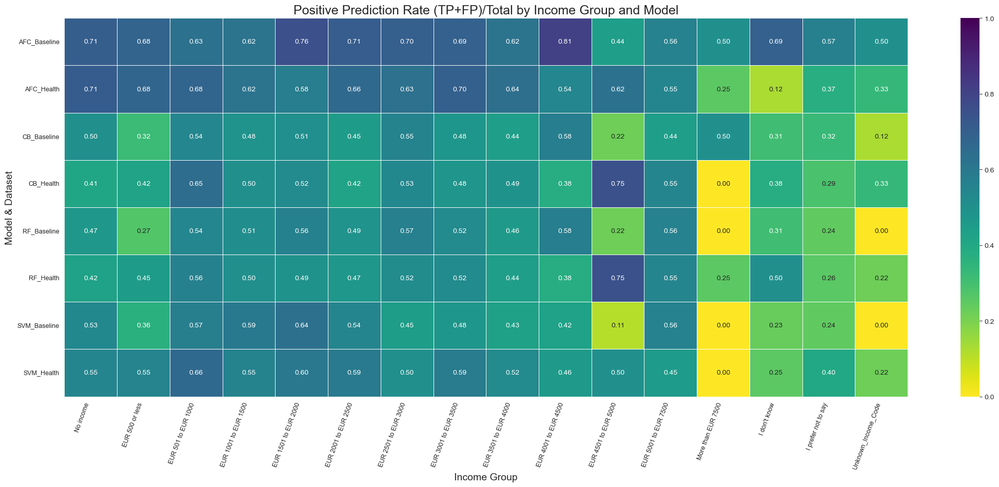


--- Generating Individual Heatmaps for CM Components ---


/var/folders/hk/gkxw9p6d3wb6_vcyr1zh90780000gn/T/ipykernel_14321/3800169042.py:247: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_model_data_df = cm_by_group_df.pivot_table(


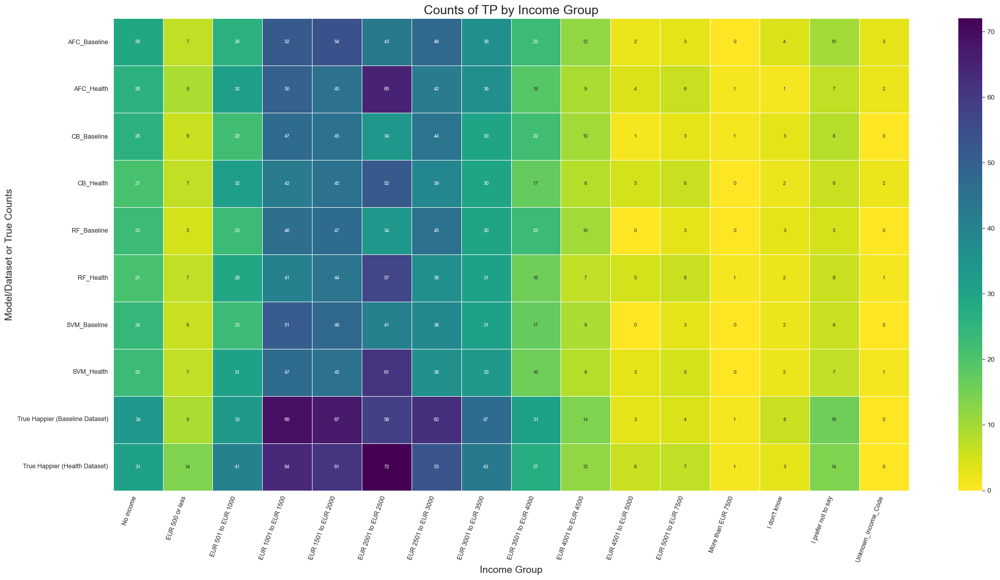

/var/folders/hk/gkxw9p6d3wb6_vcyr1zh90780000gn/T/ipykernel_14321/3800169042.py:247: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_model_data_df = cm_by_group_df.pivot_table(


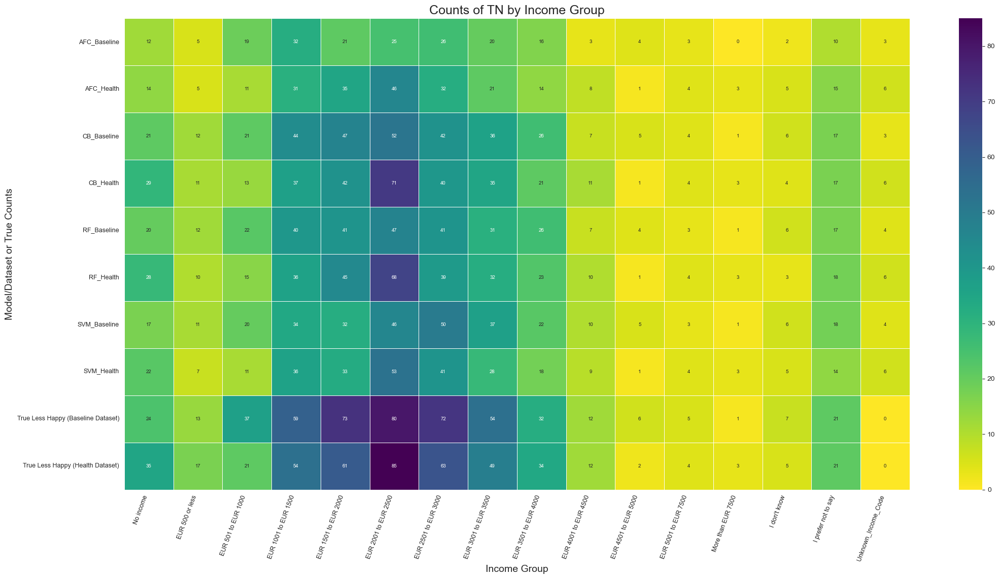

/var/folders/hk/gkxw9p6d3wb6_vcyr1zh90780000gn/T/ipykernel_14321/3800169042.py:247: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_model_data_df = cm_by_group_df.pivot_table(


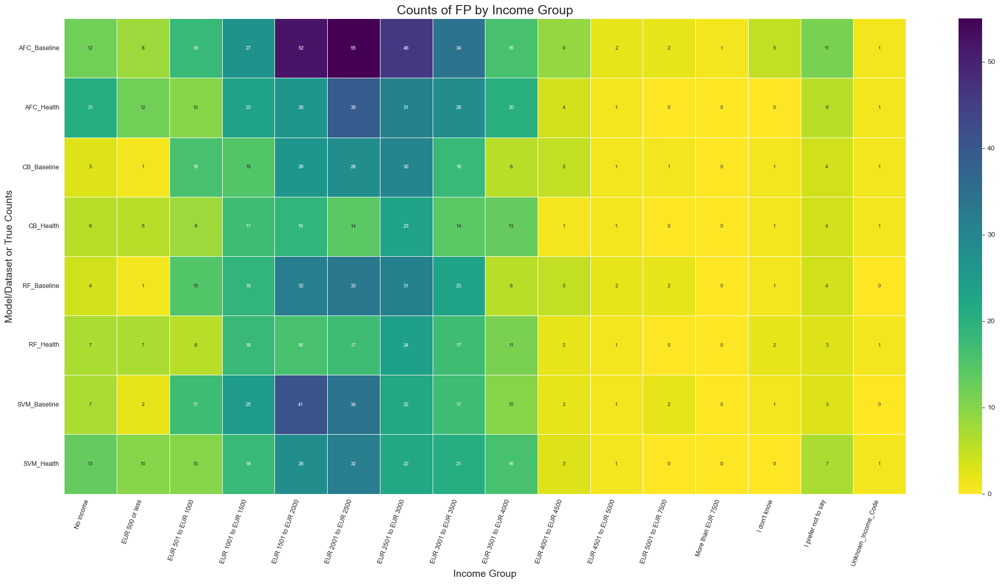

/var/folders/hk/gkxw9p6d3wb6_vcyr1zh90780000gn/T/ipykernel_14321/3800169042.py:247: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_model_data_df = cm_by_group_df.pivot_table(


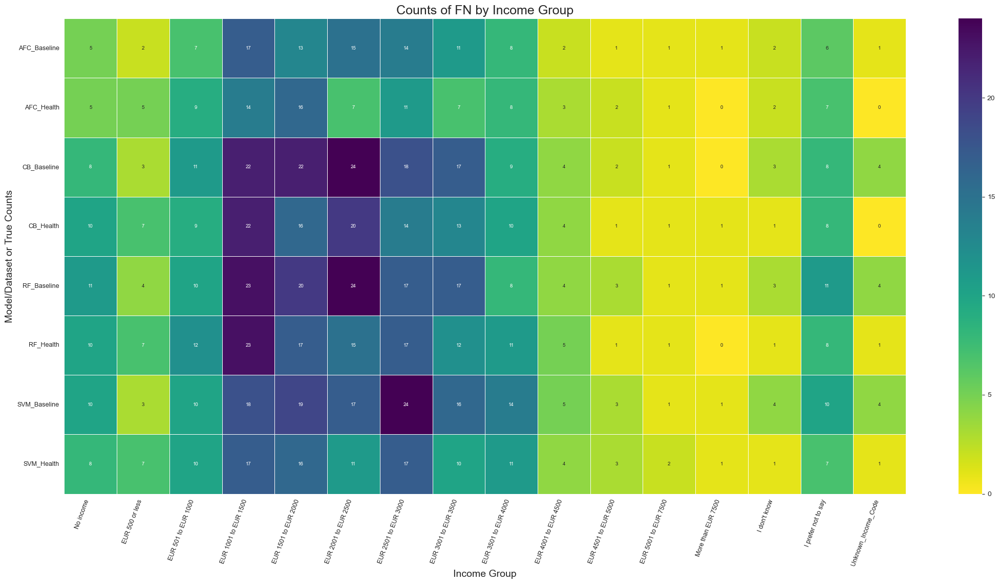

In [195]:
cm_results_list = []

models_config = [
    # Baseline Models
    {"name": "RF_Baseline", "model": rf_clf, "X_pred": X_test_scaled, "y_true_series": y_test, "X_unscaled": baseline_dataset, "dataset_type": "Baseline"},
    {"name": "CB_Baseline", "model": catboost_clf, "X_pred": X_test_scaled, "y_true_series": y_test, "X_unscaled": baseline_dataset, "dataset_type": "Baseline"},
    {"name": "SVM_Baseline", "model": svm_clf, "X_pred": X_test_scaled, "y_true_series": y_test, "X_unscaled": baseline_dataset, "dataset_type": "Baseline"},
    {"name": "AFC_Baseline", "model": final_AFC_model, "X_pred": X_test_scaled, "y_true_series": y_test, "X_unscaled": baseline_dataset, "dataset_type": "Baseline"},
    # Health Models
    {"name": "RF_Health", "model": rf_clf_health, "X_pred": X_test_health_scaled, "y_true_series": y_test_health, "X_unscaled": health_dataset, "dataset_type": "Health"},
    {"name": "CB_Health", "model": catboost_clf_health, "X_pred": X_test_health_scaled, "y_true_series": y_test_health, "X_unscaled": health_dataset, "dataset_type": "Health"},
    {"name": "SVM_Health", "model": svm_clf_health, "X_pred": X_test_health_scaled, "y_true_series": y_test_health, "X_unscaled": health_dataset, "dataset_type": "Health"},
    {"name": "AFC_Health", "model": final_AFC_model_health, "X_pred": X_test_health_scaled, "y_true_series": y_test_health, "X_unscaled": health_dataset, "dataset_type": "Health"},
]
raw_income_code_column_name = 'income'

income_code_to_label_map = {
    0: 'No income',
    1: 'EUR 500 or less',
    2: 'EUR 501 to EUR 1000',
    3: 'EUR 1001 to EUR 1500',
    4: 'EUR 1501 to EUR 2000',
    4.45257579: 'EUR 1501 to EUR 2000',
    5: 'EUR 2001 to EUR 2500',
    6: 'EUR 2501 to EUR 3000',
    7: 'EUR 3001 to EUR 3500',
    8: 'EUR 3501 to EUR 4000',
    9: 'EUR 4001 to EUR 4500',
    10: 'EUR 4501 to EUR 5000',
    11: 'EUR 5001 to EUR 7500',
    12: 'More than EUR 7500',
    13: "I don't know",
    14: "I prefer not to say"
}
# Define the order for plotting based on the map's values
# --- Create a list of unique category labels, preserving order of first appearance ---
seen_labels = set()
income_group_order_for_plotting = []
for label in income_code_to_label_map.values():
    if label not in seen_labels:
        income_group_order_for_plotting.append(label)
        seen_labels.add(label)
# Now, income_group_order_for_plotting contains unique string labels in order of first appearance.

# --- 1. Calculate True Class Distribution for each unique dataset ---
print("--- Calculating True Class Distributions for Test Sets ---")
true_dist_results_list = []
processed_datasets_for_dist = set() 

for config_dist in models_config: 
    dataset_type_dist = config_dist["dataset_type"]
    dataset_key = (id(config_dist["y_true_series"]), id(config_dist["X_unscaled"]), dataset_type_dist)

    if dataset_key in processed_datasets_for_dist:
        continue
    processed_datasets_for_dist.add(dataset_key)

    y_true_dist = config_dist["y_true_series"]
    X_unscaled_overall_dist = config_dist["X_unscaled"] 

    print(f"Calculating distribution for: {dataset_type_dist} Test Set")

    if not isinstance(y_true_dist, pd.Series):
        print(f"  ERROR: y_true_series for {dataset_type_dist} is not a Pandas Series. Skipping distribution calculation.")
        continue
    
    try:
        X_unscaled_test_set_dist = X_unscaled_overall_dist.loc[y_true_dist.index]

        if raw_income_code_column_name not in X_unscaled_test_set_dist.columns:
            print(f"  ERROR: Raw income code column '{raw_income_code_column_name}' not found for {dataset_type_dist}. Skipping.")
            continue
        
        raw_codes = pd.to_numeric(X_unscaled_test_set_dist[raw_income_code_column_name], errors='coerce')
        income_labels = raw_codes.map(income_code_to_label_map).fillna('Unknown_Income_Code')
        
        temp_dist_df = pd.DataFrame({'true_label': y_true_dist.values, 'income_group': income_labels.values}, index=y_true_dist.index)
        
        for group_label in income_group_order_for_plotting: 
            group_data = temp_dist_df[temp_dist_df['income_group'] == group_label]
            total_in_group = len(group_data)
            happier_count = (group_data['true_label'] == 1).sum() if total_in_group > 0 else 0
            less_happy_count = (group_data['true_label'] == 0).sum() if total_in_group > 0 else 0
            
            true_dist_results_list.append({
                'dataset_type': dataset_type_dist,
                'income_group': group_label,
                'Less_Happy_Count_True': int(less_happy_count),
                'Happier_Count_True': int(happier_count),
                'Total_In_Group_True': int(total_in_group)
            })
    except KeyError as e_key:
        print(f"  ERROR: KeyError during distribution calculation for {dataset_type_dist}. Details: {e_key}. Skipping.")
        continue
    except Exception as e:
        print(f"  Error calculating distribution for {dataset_type_dist}: {e}")

true_distribution_summary_df = pd.DataFrame(true_dist_results_list)
if not true_distribution_summary_df.empty:
    true_distribution_summary_df['income_group'] = pd.Categorical(
        true_distribution_summary_df['income_group'], 
        categories=income_group_order_for_plotting, 
        ordered=True
    )
    print("\nTrue Class Distribution Summary (Test Sets):")
    # print(true_distribution_summary_df.sort_values(by=['dataset_type', 'income_group']).to_string()) # Already printed by user
    true_dist_pivot_for_lookup = true_distribution_summary_df.pivot_table(
        index='income_group', 
        columns='dataset_type', 
        values=['Happier_Count_True', 'Less_Happy_Count_True', 'Total_In_Group_True'], # Added Total for PPR calc
        aggfunc='sum', 
        fill_value=0
    )
else:
    print("Could not generate true class distribution summary.")
    true_dist_pivot_for_lookup = pd.DataFrame() 


# --- 2. Calculate CM Components per Income Group (Main Analysis Loop) ---
cm_results_list = [] 
model_dataset_to_type_map = {config['name']: config['dataset_type'] for config in models_config}

if raw_income_code_column_name == 'PLEASE_SET_THIS_COLUMN_NAME': 
     print("ERROR: Please set the 'raw_income_code_column_name' variable (e.g., to 'income' or 'nettohh_f').")
else:
    for config in models_config:
        model_name_full = config["name"]
        model = config["model"]
        X_for_prediction = config["X_pred"] 
        y_true = config["y_true_series"]    
        X_unscaled_data = config["X_unscaled"] 
        dataset_type = config["dataset_type"]

        # print(f"Processing CM components for: {model_name_full} on {dataset_type} dataset...") # Already printed by user

        if raw_income_code_column_name not in X_unscaled_data.columns:
            continue
        
        if isinstance(y_true, pd.Series) and isinstance(X_for_prediction, pd.DataFrame):
            if not X_for_prediction.index.equals(y_true.index):
                continue
        elif not (len(X_for_prediction) == len(y_true)):
            continue

        try:
            index_to_use = y_true.index if isinstance(y_true, pd.Series) else X_for_prediction.index
            raw_income_codes_series = pd.to_numeric(X_unscaled_data.loc[index_to_use, raw_income_code_column_name], errors='coerce')
            current_income_groups_mapped = raw_income_codes_series.map(income_code_to_label_map).fillna('Unknown_Income_Code')
            
            if 'Unknown_Income_Code' not in income_group_order_for_plotting and 'Unknown_Income_Code' in current_income_groups_mapped.unique():
                if 'Unknown_Income_Code' not in seen_labels: 
                    income_group_order_for_plotting.append('Unknown_Income_Code')
                    seen_labels.add('Unknown_Income_Code')
        except KeyError: 
            continue
        except Exception:
            continue

        try:
            y_pred = model.predict(X_for_prediction)
        except Exception:
            try:
                y_pred = model.predict(X_for_prediction.values) 
            except Exception:
                continue
                
        y_pred = np.array(y_pred).squeeze()
        y_true_np = y_true.squeeze().to_numpy() if isinstance(y_true, (pd.Series, pd.DataFrame)) else np.array(y_true).squeeze()

        if len(y_pred) != len(y_true_np) or len(y_pred) != len(current_income_groups_mapped):
            continue

        temp_df = pd.DataFrame({
            'y_true': y_true_np, 'y_pred': y_pred, 'income_group': current_income_groups_mapped
        })

        for group_label_to_plot in income_group_order_for_plotting: 
            group_df = temp_df[temp_df['income_group'] == group_label_to_plot]
            tn, fp, fn, tp = 0, 0, 0, 0 
            if not group_df.empty:
                cm_values = confusion_matrix(group_df['y_true'], group_df['y_pred'], labels=[0, 1]).ravel()
                if len(cm_values) == 4: tn, fp, fn, tp = cm_values
            cm_results_list.append({
                'model_dataset': model_name_full, 'dataset_type': dataset_type,
                'income_group': group_label_to_plot, 'TP': int(tp), 'TN': int(tn), 
                'FP': int(fp), 'FN': int(fn)
            })
    
    cm_by_group_df = pd.DataFrame(cm_results_list)

    if not cm_by_group_df.empty:
        final_unique_categories = [lbl for lbl in income_group_order_for_plotting if lbl in cm_by_group_df['income_group'].unique()]
        if not final_unique_categories: 
            final_unique_categories = income_group_order_for_plotting
            
        cm_by_group_df['income_group'] = pd.Categorical(
            cm_by_group_df['income_group'], 
            categories=final_unique_categories, 
            ordered=True
        )
    # print("\n--- CM Components by Income Group ---") # Already printed by user
    
    # --- 3. Visualization ---
    if not cm_by_group_df.empty:
        sns.set_style("whitegrid")

        # --- 3a. Heatmap for Positive Prediction Rate (PPR) ---
        print("\n--- Generating Heatmap for Positive Prediction Rate ---")
        try:
            # Calculate TP+FP and Total for PPR
            cm_by_group_df['TP_plus_FP'] = cm_by_group_df['TP'] + cm_by_group_df['FP']
            cm_by_group_df['Total_in_Pred_Group'] = cm_by_group_df['TP'] + cm_by_group_df['TN'] + cm_by_group_df['FP'] + cm_by_group_df['FN']
            cm_by_group_df['Positive_Prediction_Rate'] = cm_by_group_df.apply(
                lambda row: (row['TP_plus_FP'] / row['Total_in_Pred_Group']) if row['Total_in_Pred_Group'] > 0 else 0, axis=1
            )

            ppr_pivot_df = cm_by_group_df.pivot_table(
                index='model_dataset', columns='income_group', values='Positive_Prediction_Rate',
                aggfunc='mean', # Should be unique, mean is safe
                dropna=False
            )
            ppr_pivot_df = ppr_pivot_df.reindex(columns=final_unique_categories, fill_value=0)
            ppr_pivot_df = ppr_pivot_df.fillna(0) # Fill any NaNs that might arise if a group had 0 total

            plt.figure(figsize=(22, 10)) # Adjusted figsize
            sns.heatmap(ppr_pivot_df, annot=True, fmt=".2f", cmap="viridis_r", linewidths=.5, cbar=True, vmin=0, vmax=1)
            plt.title('Positive Prediction Rate (TP+FP)/Total by Income Group and Model', fontsize=18)
            plt.xlabel('Income Group', fontsize=14)
            plt.ylabel('Model & Dataset', fontsize=14)
            plt.xticks(rotation=70, ha='right', fontsize=9)
            plt.yticks(rotation=0, fontsize=9)
            plt.tight_layout(rect=[0, 0, 1, 0.96])
            plt.show()

        except Exception as e:
            print(f"Could not generate Positive Prediction Rate heatmap: {e}")


        # --- 3b. Individual Heatmaps for TP, TN, FP, FN ---
        print("\n--- Generating Individual Heatmaps for CM Components ---")
        cm_metrics_to_plot = ['TP', 'TN', 'FP', 'FN']
        
        for metric_type in cm_metrics_to_plot:
            plt.figure(figsize=(22, 12)) # Create a new figure for each heatmap
            
            try:
                pivot_model_data_df = cm_by_group_df.pivot_table(
                    index='model_dataset', columns='income_group', values=metric_type, aggfunc='sum',
                    dropna=False 
                )
                pivot_model_data_df = pivot_model_data_df.reindex(columns=final_unique_categories, fill_value=0)

                data_for_heatmap = pivot_model_data_df.copy()

                if metric_type == 'TP' and isinstance(true_dist_pivot_for_lookup, pd.DataFrame) and not true_dist_pivot_for_lookup.empty:
                    if ('Happier_Count_True', 'Baseline') in true_dist_pivot_for_lookup.columns:
                        baseline_true_tps = true_dist_pivot_for_lookup[('Happier_Count_True', 'Baseline')].reindex(final_unique_categories, fill_value=0)
                        data_for_heatmap.loc['True Happier (Baseline Dataset)'] = baseline_true_tps.values 
                    if ('Happier_Count_True', 'Health') in true_dist_pivot_for_lookup.columns:
                        health_true_tps = true_dist_pivot_for_lookup[('Happier_Count_True', 'Health')].reindex(final_unique_categories, fill_value=0)
                        data_for_heatmap.loc['True Happier (Health Dataset)'] = health_true_tps.values
                elif metric_type == 'TN' and isinstance(true_dist_pivot_for_lookup, pd.DataFrame) and not true_dist_pivot_for_lookup.empty:
                    if ('Less_Happy_Count_True', 'Baseline') in true_dist_pivot_for_lookup.columns:
                        baseline_true_tns = true_dist_pivot_for_lookup[('Less_Happy_Count_True', 'Baseline')].reindex(final_unique_categories, fill_value=0)
                        data_for_heatmap.loc['True Less Happy (Baseline Dataset)'] = baseline_true_tns.values
                    if ('Less_Happy_Count_True', 'Health') in true_dist_pivot_for_lookup.columns:
                        health_true_tns = true_dist_pivot_for_lookup[('Less_Happy_Count_True', 'Health')].reindex(final_unique_categories, fill_value=0)
                        data_for_heatmap.loc['True Less Happy (Health Dataset)'] = health_true_tns.values
                
                data_for_heatmap = data_for_heatmap.fillna(0).astype(int)

                sns.heatmap(data_for_heatmap, annot=True, fmt="d", cmap="viridis_r", 
                            linewidths=.5, cbar=True, annot_kws={"size": 7})
            
            except Exception as e:
                print(f"Could not pivot/plot data for heatmap of {metric_type}: {e}")
                plt.text(0.5, 0.5, f'Error plotting {metric_type}.', ha='center', va='center') # Add text to empty plot
                # Fallback title and labels if heatmap fails
                plt.title(f'Counts of {metric_type} by Income Group (Error)', fontsize=18)
                plt.xlabel('Income Group', fontsize=14)
                plt.ylabel('Model/Dataset or True Counts', fontsize=14)
                plt.xticks([])
                plt.yticks([])
                plt.show() # Show the plot with error message
                continue 

            plt.title(f'Counts of {metric_type} by Income Group', fontsize=18)
            plt.xlabel('Income Group', fontsize=14)
            plt.ylabel('Model/Dataset or True Counts', fontsize=14) 
            plt.xticks(rotation=70, ha='right', fontsize=9) 
            plt.yticks(rotation=0, fontsize=9)
            plt.tight_layout(rect=[0, 0, 1, 0.96]) 
            plt.show()
    else:
        print("Skipping visualization: cm_by_group_df is empty or true_dist_pivot_for_lookup could not be generated/is empty.")



In [ ]:
# exporting the trained model for easy use later
# No need to run the full training cycle every time
import joblib

#Health
# Save RF model (Health)
joblib.dump(rf_clf_health, 'rf_model_health.joblib')

# Save SVC model (Health)
joblib.dump(svm_clf_health, 'svc_model_health.joblib')
print("RF and SVC models for health data saved.")

# Save CatBoost model (Health)
catboost_clf_health.save_model('catboost_model_health.cbm')
print("CatBoost model for health data saved.")


#Baseline
# Save RF model (Baseline)
joblib.dump(rf_clf, 'rf_model_baseline.joblib')
print("RF model for baseline data saved.")

# Save SVC model (Baseline)
joblib.dump(svm_clf, 'svc_model_baseline.joblib')
print("SVC model for baseline data saved.")

# Save CatBoost model (Baseline)
catboost_clf.save_model('catboost_model_baseline.cbm')
print("CatBoost model for baseline data saved.")



RF and SVC models for health data saved.
CatBoost model for health data saved.
RF model for baseline data saved.
SVC model for baseline data saved.
CatBoost model for baseline data saved.
